## Data Analysis for Round 5

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA

import sys
sys.path.append('./../')  # Add the parent directory to Python path
from plot_utils_CY import *

## Outline for Overall
1. Data Loading: Load your trading data into a Pandas DataFrame. This could be in the form of a CSV file, a database query result, or any other structured data format.
1. Data Cleaning: Clean the data by handling missing values, removing duplicates, and converting data types if necessary.
1. Data Manipulation: Perform data manipulation tasks such as calculating returns, creating new features, or aggregating data.
1. Data Analysis: Analyze the trading data using statistical methods and visualizations. See below `Outline for Data Analysis` for specifics.
1. Performance Metrics: Calculate performance metrics such as Sharpe Ratio, Maximum Drawdown, and Win Rate.
1. Visualization: Visualize performance metrics and other relevant information using Matplotlib or other plotting libraries.

### Data Loading
* Loading price data and trade data into dataframes
* Merging data of the same format from different days

In [26]:
path = '../../shared_data/round5/'
ddays  = [-3, -2, -1]
rounds = [1, 3, 4]
prod_days = {
    'AMETHYSTS':      [-2, -1, 0],
    'STARFRUIT':      [-2, -1, 0],
    'ORCHIDS':        [-1, 0, 1],
    'GIFT_BASKET':    [0, 1, 2],
    'CHOCOLATE':      [0, 1, 2],
    'STRAWBERRIES':   [0, 1, 2],
    'ROSES':          [0, 1, 2],
    'COCONUT':        [1, 2, 3],
    'COCONUT_COUPON': [1, 2, 3],
}

trade = pd.DataFrame()
for r in rounds:
    for d in ddays:
        df = pd.read_csv(path + f'trades_round_{r}_day_{d+r}_wn.csv', sep=';') 
        df['day'] = d+r
        trade = pd.concat([trade, df])

trade

,timestamp,buyer,seller,symbol,currency,price,quantity,day
0,0,Vinnie,Ruby,AMETHYSTS,SEASHELLS,9996.0,1,-2
1,0,Remy,Valentina,STARFRUIT,SEASHELLS,5003.0,1,-2
2,0,Remy,Ruby,AMETHYSTS,SEASHELLS,9996.0,1,-2
3,100,Ruby,Valentina,STARFRUIT,SEASHELLS,5004.0,6,-2
4,900,Rhianna,Valentina,STARFRUIT,SEASHELLS,5001.0,2,-2
...,...,...,...,...,...,...,...,...
1691,996200,Valentina,Vinnie,COCONUT_COUPON,SEASHELLS,585.0,14,3
1692,997100,Vinnie,Vinnie,COCONUT,SEASHELLS,9885.0,9,3
1693,997200,Vinnie,Vinnie,COCONUT,SEASHELLS,9883.0,8,3
1694,998600,Vinnie,Raj,COCONUT,SEASHELLS,9887.0,5,3


### Data Cleaning
* Counting the number of missing values in the data, per column

In [20]:
trade.isna().sum()

timestamp    0
buyer        0
seller       0
symbol       0
currency     0
price        0
quantity     0
day          0
dtype: int64

## Outline for Data Analysis
1. Descriptive Statistics: see below 
1. Visualization: see below `Outline for Data Visualization` for details
1. Correlation Analysis: see below `Outline for Correlation Analysis` for details
1. Volatility Analysis: see below `Outline for Volatility Analysis` for details
1. Autocorrelation Analysis: see below `Outline for Autocorrelation Analysis` for details
1. Stationarity Analysis: see below `Outline for Stationarity Analysis` for details
1. Seasonality Analysis: see below `Outline for Seasonality Analysis` for details
1. Modeling: see below `Outline for Data Modeling` for details
1. Outlier Detection: see below `Outline for Outlier Detection` for details

### Outline for Descriptive Statistics

For each day and each product, make -
- table to describe behavior of different sellers
- table to describe behavior of different buyers
- table to charaterize the PnL of each market participant

In [36]:
trade

,timestamp,buyer,seller,symbol,currency,price,quantity,day
0,0,Vinnie,Ruby,AMETHYSTS,SEASHELLS,9996.0,1,-2
1,0,Remy,Valentina,STARFRUIT,SEASHELLS,5003.0,1,-2
2,0,Remy,Ruby,AMETHYSTS,SEASHELLS,9996.0,1,-2
3,100,Ruby,Valentina,STARFRUIT,SEASHELLS,5004.0,6,-2
4,900,Rhianna,Valentina,STARFRUIT,SEASHELLS,5001.0,2,-2
...,...,...,...,...,...,...,...,...
1691,996200,Valentina,Vinnie,COCONUT_COUPON,SEASHELLS,585.0,14,3
1692,997100,Vinnie,Vinnie,COCONUT,SEASHELLS,9885.0,9,3
1693,997200,Vinnie,Vinnie,COCONUT,SEASHELLS,9883.0,8,3
1694,998600,Vinnie,Raj,COCONUT,SEASHELLS,9887.0,5,3


In [62]:
products = trade['symbol'].unique()
traders = trade['buyer'].unique()
buyer_stats = {p: pd.DataFrame() for p in products}
seller_stats = {p: pd.DataFrame() for p in products}

for product in products:
    df = trade[trade['symbol'] == product]
    buyer_stats[product] = df.groupby('buyer')['price'].describe()
    seller_stats[product] = df.groupby('seller')['price'].describe()

In [64]:
buyer_stats['AMETHYSTS']

,count,mean,std,min,25%,50%,75%,max
buyer,,,,,,,,
Adam,131.0,10001.389313,1.444206,9998.0,10002.0,10002.0,10002.0,10002.0
Amelia,302.0,10003.437086,1.871543,9998.0,10004.0,10004.0,10004.0,10005.0
Remy,2197.0,10002.575330,1.732417,9996.0,10002.0,10002.0,10004.0,10005.0
Rhianna,655.0,10002.000000,0.000000,10002.0,10002.0,10002.0,10002.0,10002.0
Ruby,509.0,10003.447937,1.877063,9996.0,10004.0,10004.0,10004.0,10005.0
Valentina,1739.0,9997.008051,1.319476,9995.0,9996.0,9998.0,9998.0,9998.0
Vinnie,949.0,9996.351949,0.953811,9996.0,9996.0,9996.0,9996.0,10000.0
Vladimir,753.0,9998.000000,0.000000,9998.0,9998.0,9998.0,9998.0,9998.0


In [65]:
seller_stats['AMETHYSTS']

,count,mean,std,min,25%,50%,75%,max
seller,,,,,,,,
Adam,142.0,9998.732394,1.552465,9998.0,9998.0,9998.0,9998.0,10002.0
Amelia,302.0,9996.612583,1.842352,9995.0,9996.0,9996.0,9996.0,10002.0
Remy,2182.0,9997.472961,1.716215,9995.0,9996.0,9998.0,9998.0,10004.0
Rhianna,677.0,9998.000000,0.000000,9998.0,9998.0,9998.0,9998.0,9998.0
Ruby,604.0,9996.519868,1.743389,9995.0,9996.0,9996.0,9996.0,10004.0
Valentina,1725.0,10002.991884,1.332245,10002.0,10002.0,10002.0,10005.0,10005.0
Vinnie,906.0,10003.741722,0.830072,10000.0,10004.0,10004.0,10004.0,10004.0
Vladimir,697.0,10002.000000,0.000000,10002.0,10002.0,10002.0,10002.0,10002.0


In [68]:
buyer_stats['STARFRUIT']

,count,mean,std,min,25%,50%,75%,max
buyer,,,,,,,,
Adam,232.0,5035.935345,32.595914,4952.0,5026.00,5047.0,5056.00,5089.0
Amelia,339.0,5041.333333,31.602156,4957.0,5033.00,5050.0,5063.00,5092.0
Remy,2686.0,5040.062547,31.680161,4954.0,5030.00,5050.0,5061.00,5094.0
Rhianna,487.0,5039.125257,30.796804,4954.0,5030.50,5049.0,5060.00,5092.0
Ruby,486.0,5041.393004,29.281567,4957.0,5031.00,5051.0,5061.75,5092.0
Valentina,3218.0,5033.182411,32.625321,4949.0,5021.00,5044.0,5055.00,5089.0
Vinnie,683.0,5033.408492,31.899747,4951.0,5021.00,5044.0,5055.00,5085.0
Vladimir,784.0,5035.577806,31.562933,4949.0,5027.75,5046.0,5055.25,5088.0


In [69]:
seller_stats['STARFRUIT']

,count,mean,std,min,25%,50%,75%,max
seller,,,,,,,,
Adam,251.0,5031.856574,32.017298,4951.0,5016.0,5041.0,5055.0,5086.0
Amelia,325.0,5035.418462,32.226201,4952.0,5028.0,5046.0,5057.0,5086.0
Remy,3190.0,5033.182445,32.444495,4949.0,5021.0,5044.0,5055.0,5090.0
Rhianna,539.0,5034.335807,31.683502,4952.0,5022.0,5045.0,5053.5,5089.0
Ruby,518.0,5037.671815,30.025979,4949.0,5029.0,5045.0,5057.0,5092.0
Valentina,2648.0,5040.384441,31.367032,4954.0,5031.0,5050.0,5061.0,5094.0
Vinnie,629.0,5038.594595,32.798789,4952.0,5030.0,5050.0,5060.0,5091.0
Vladimir,815.0,5039.295706,31.806690,4954.0,5030.0,5050.0,5060.0,5090.0


In [70]:
buyer_stats['GIFT_BASKET']

,count,mean,std,min,25%,50%,75%,max
buyer,,,,,,,,
Rhianna,358.0,70714.203911,595.817608,69370.0,70225.50,70914.0,71177.75,71569.0
Ruby,385.0,70711.825974,586.594096,69399.0,70338.00,70929.0,71142.00,71545.0
Vinnie,558.0,70668.401434,612.633759,69352.0,69969.50,70890.5,71160.25,71525.0
Vladimir,464.0,70720.084052,571.835991,69436.0,70370.75,70903.5,71159.25,71541.0


In [71]:
seller_stats['GIFT_BASKET']

,count,mean,std,min,25%,50%,75%,max
seller,,,,,,,,
Rhianna,592.0,70700.853041,583.313756,69442.0,70099.75,70905.0,71156.25,71541.0
Ruby,403.0,70690.506203,604.896559,69352.0,70221.50,70898.0,71170.50,71537.0
Vinnie,486.0,70700.323045,590.809346,69370.0,70210.75,70911.5,71144.00,71545.0
Vladimir,284.0,70715.806338,602.136738,69370.0,70279.75,70927.0,71179.25,71569.0


In [72]:
buyer_stats['CHOCOLATE']

,count,mean,std,min,25%,50%,75%,max
buyer,,,,,,,,
Remy,1077.0,7918.116063,98.955617,7719.0,7853.00,7942.0,8007.00,8061.0
Vinnie,1768.0,7912.380090,100.687784,7718.0,7809.75,7931.0,8004.25,8058.0
Vladimir,3.0,7919.000000,143.885371,7753.0,7874.50,7996.0,8002.00,8008.0


In [73]:
seller_stats['CHOCOLATE']

,count,mean,std,min,25%,50%,75%,max
seller,,,,,,,,
Remy,1188.0,7912.747475,100.995893,7718.0,7809.75,7937.0,8005.0,8058.0
Vinnie,1071.0,7918.052288,99.073092,7719.0,7852.50,7942.0,8007.0,8061.0
Vladimir,589.0,7911.847199,100.019932,7720.0,7811.00,7910.0,8003.0,8055.0


In [74]:
buyer_stats['COCONUT_COUPON']

,count,mean,std,min,25%,50%,75%,max
buyer,,,,,,,,
Rhianna,10.0,630.800000,46.518336,549.0,592.00,656.0,663.75,676.0
Ruby,380.0,633.365789,44.945178,533.0,593.00,640.0,668.25,733.0
Valentina,2531.0,635.424338,46.942132,531.0,591.50,647.0,673.00,740.0
Vinnie,25.0,640.800000,43.566042,577.0,601.00,648.0,663.00,735.0
Vladimir,214.0,634.859813,46.385696,536.0,595.25,646.0,670.75,740.0


In [75]:
seller_stats['COCONUT_COUPON']

,count,mean,std,min,25%,50%,75%,max
seller,,,,,,,,
Rhianna,388.0,634.291237,47.315208,531.0,589.75,645.0,672.25,740.0
Ruby,439.0,633.965831,46.624814,531.0,592.00,647.0,670.50,737.0
Valentina,671.0,634.657228,45.973827,533.0,593.00,642.0,671.00,736.0
Vinnie,1623.0,636.039433,46.768414,531.0,592.00,647.0,673.00,740.0
Vladimir,39.0,629.820513,46.017658,553.0,583.50,639.0,660.00,731.0


In [76]:
buyer_stats['COCONUT']

,count,mean,std,min,25%,50%,75%,max
buyer,,,,,,,,
Raj,210.0,10009.090476,86.895507,9811.0,9946.5,10034.0,10081.00,10136.0
Rhianna,181.0,9997.143646,88.136140,9828.0,9909.0,10026.0,10072.00,10133.0
Vinnie,1578.0,9997.802915,89.410554,9810.0,9912.0,10025.0,10076.75,10141.0


In [77]:
seller_stats['COCONUT']

,count,mean,std,min,25%,50%,75%,max
seller,,,,,,,,
Raj,221.0,10001.063348,91.147012,9824.0,9909.0,10029.0,10079.0,10140.0
Rhianna,197.0,10002.162437,87.711110,9810.0,9916.0,10036.0,10077.0,10140.0
Vinnie,1551.0,9998.235977,88.965929,9811.0,9914.0,10026.0,10076.0,10141.0


In [81]:
columns = ['product', 'trader', 'buy_price', 'sell_price', 'buy_qty', 'sell_qty', 
           'buy_profit', 'sell_profit', 'total_profit', 'avg_profit']
profit = pd.DataFrame(columns=columns)

for product in products:
    for trader in traders:
        buy_df = trade[(trade['symbol'] == product) & (trade['buyer'] == trader)]
        sell_df = trade[(trade['symbol'] == product) & (trade['seller'] == trader)]

        buy_price   = -(buy_df['price']).sum()
        sell_price  = (sell_df['price']).sum()
        buy_qty   = (buy_df['quantity']).sum()
        sell_qty  = (sell_df['quantity']).sum()
        buy_profit   = -(buy_df['price'] * buy_df['quantity']).sum()
        sell_profit  = (sell_df['price'] * sell_df['quantity']).sum()

        total_profit = buy_profit + sell_profit
        avg_profit = (buy_profit / buy_qty) + (sell_profit / sell_qty) if (buy_qty != 0 and sell_qty != 0) else 0

        profit = pd.concat([profit, 
                            pd.DataFrame([[product, trader, buy_price, sell_price, buy_qty, sell_qty, 
                                           buy_profit, sell_profit, total_profit, avg_profit]], 
                            columns=columns)], ignore_index=True)

profit

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/2622130455.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  profit = pd.concat([profit,


,product,trader,buy_price,sell_price,buy_qty,sell_qty,buy_profit,sell_profit,total_profit,avg_profit
0,AMETHYSTS,Vinnie,-9486538.0,9063390.0,1340,1271,-13395240.0,12714606.0,-680634.0,7.176157
1,AMETHYSTS,Remy,-21975658.0,21814486.0,2535,2512,-25356914.0,25113288.0,-243626.0,-5.399391
2,AMETHYSTS,Ruby,-5091755.0,6037898.0,1506,1796,-15065445.0,17953393.0,2887948.0,-7.294268
3,AMETHYSTS,Rhianna,-6551310.0,6768646.0,1750,1715,-17503500.0,17146570.0,-356930.0,-4.000000
4,AMETHYSTS,Valentina,-17384797.0,17255161.0,4383,4395,-43814722.0,43965140.0,150418.0,6.930564
...,...,...,...,...,...,...,...,...,...,...
67,COCONUT,Valentina,-0.0,0.0,0,0,-0.0,0.0,0.0,0.000000
68,COCONUT,Vladimir,-0.0,0.0,0,0,-0.0,0.0,0.0,0.000000
69,COCONUT,Adam,-0.0,0.0,0,0,-0.0,0.0,0.0,0.000000
70,COCONUT,Amelia,-0.0,0.0,0,0,-0.0,0.0,0.0,0.000000


In [82]:
profit_pivot = profit.pivot(index='trader', columns='product', values='avg_profit')
profit_pivot

product,AMETHYSTS,CHOCOLATE,COCONUT,COCONUT_COUPON,GIFT_BASKET,ROSES,STARFRUIT,STRAWBERRIES
trader,,,,,,,,
Adam,-3.477175,0.000000,0.000000,0.000000,0.000000,0.000000,-7.007368,0.000000
Amelia,-7.850463,0.000000,0.000000,0.000000,0.000000,0.000000,-6.447477,0.000000
Raj,0.000000,0.000000,-4.171915,0.000000,0.000000,0.000000,0.000000,0.000000
Remy,-5.399391,-6.458241,0.000000,0.000000,0.000000,-2.239472,-7.050409,-1.397247
Rhianna,-4.000000,0.000000,8.062944,8.854557,7.707124,376.000000,-4.281787,0.000000
Ruby,-7.294268,0.000000,0.000000,0.155296,-28.973735,0.000000,-5.111311,0.000000
Valentina,6.930564,0.000000,0.000000,-0.981821,0.000000,0.000000,6.468583,0.000000
Vinnie,7.176157,6.825948,0.273090,-13.943847,60.880350,4.032157,3.681449,1.714523
Vladimir,4.000000,-6.517174,0.000000,-13.314336,-8.343104,78.738062,3.848367,-16.648456


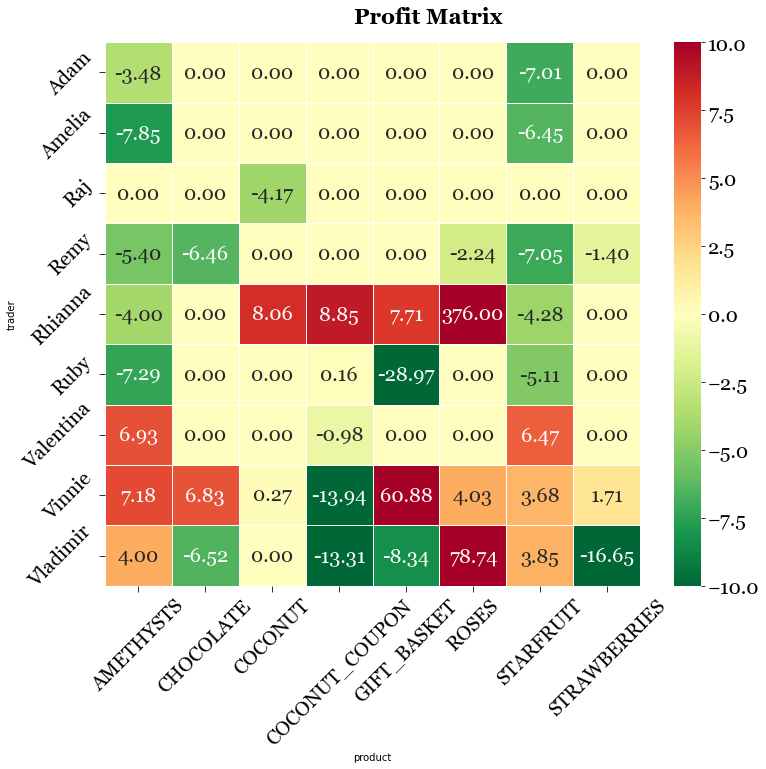

In [103]:
# Plot heatmap
fig = plt.figure(figsize=(12, 10))
ax = plt.gca()

# Plot heatmap with colorbar and customized font
heatmap = sns.heatmap(profit_pivot, annot=True, cmap='RdYlGn_r', 
                      fmt=".2f", linewidths=0.5, 
                      vmin=-10, vmax=10, cbar=True,
                      cbar_kws={"orientation": "vertical"},
                      annot_kws={"size": 20,
                                 "fontdict": font})

# Adjust label size and tick length for both x and y axes
plt.xticks(rotation=45)
plt.yticks(rotation=45)

plt.tick_params(axis='both', which='major', labelsize=18, length=6)

# Set font properties for tick labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontdict=font)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontdict=font)

# Colorbar settings
cbar = heatmap.collections[0].colorbar
cbar.set_label(cbar.ax.get_ylabel(), fontdict=font)
heatmap.figure.axes[-1].yaxis.label.set_size(font['size'])  # Set colorbar label font size
heatmap.figure.axes[-1].tick_params(labelsize=font['size'])  # Set colorbar tick font size
for label in heatmap.figure.axes[-1].get_yticklabels():
    label.set_fontname("Georgia")

plt.gcf().set_facecolor('white')
fig.suptitle(f'Profit Matrix', fontproperties=suptitle_font, y=0.93)

# plt.savefig(f'./../plots/R5_profit_matrix.png')
# plt.savefig(f'./../plots/R5_profit_matrix.pdf')
plt.show()

### Outline for Data Visualization 
For each day and each product and each counterparty trader, make -
1. An overlayed time series plot of buyers
   * scatter of `price` sized by `quantity` colored by trader

1. An overlayed time series plot of sellers
   * scatter of `price` sized by `quantity` colored by trader

1. A time series plot of overlayed individual buys and sells
   * scatter of `buyer` trade, scaled by `quantity`, shaped by `day`
   * scatter of `seller` trade, scaled by `quantity`, shaped by `day`

1. A matrix of profit
   * column as `product`, row as `trader`

An overlayed time series plot of buyers
   * scatter of `price` sized by `quantity` colored by trader

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


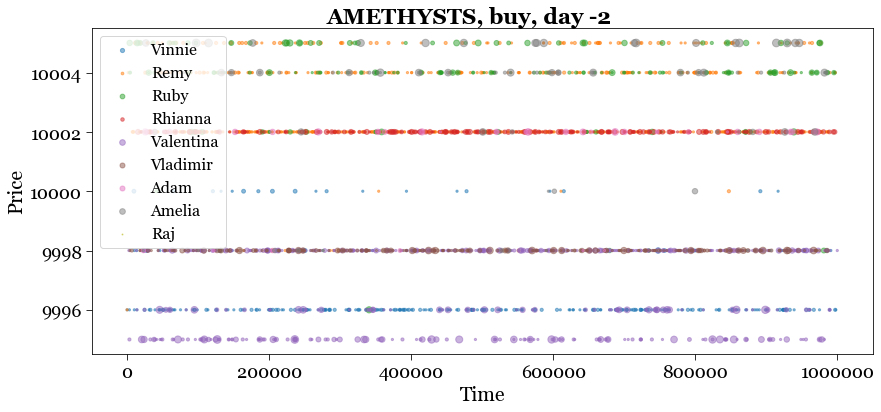

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


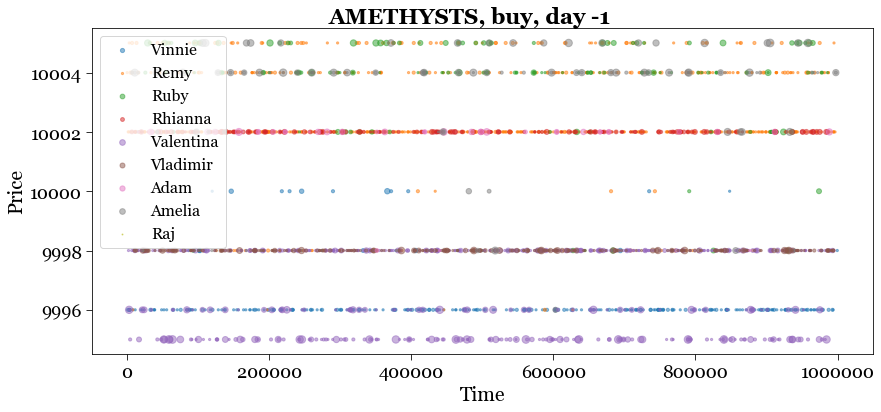

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


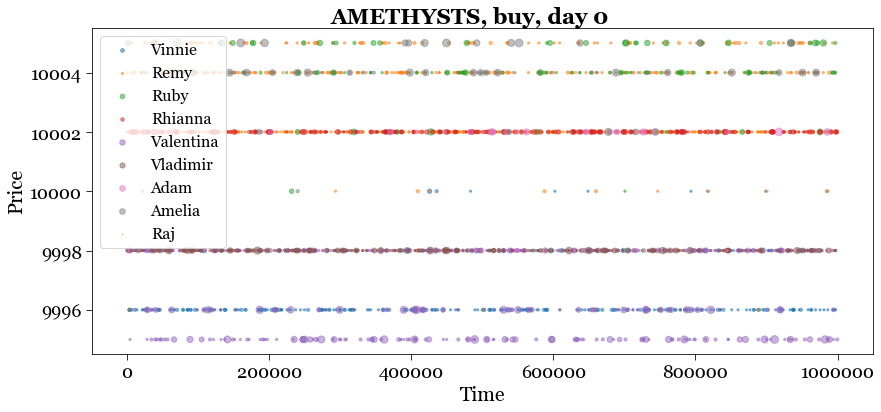

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


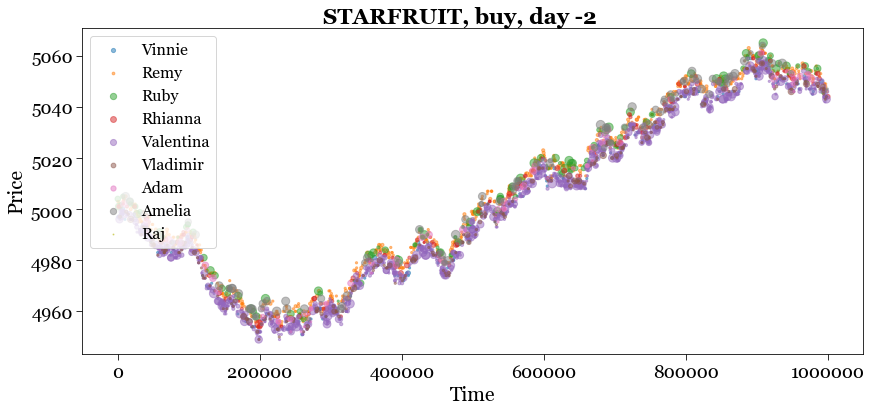

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


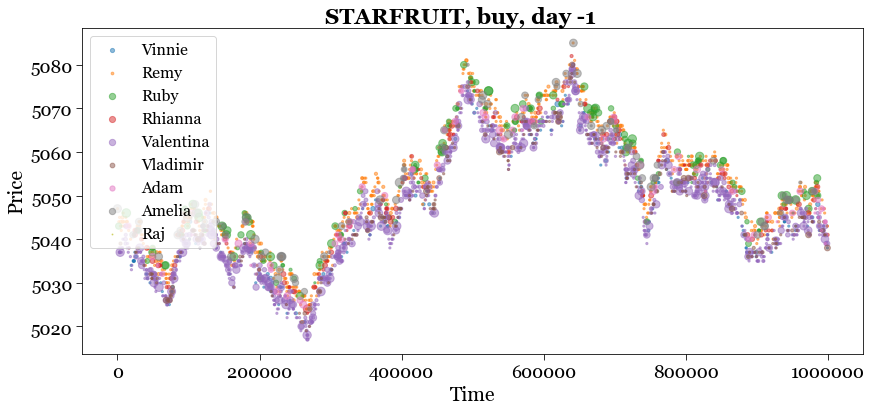

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


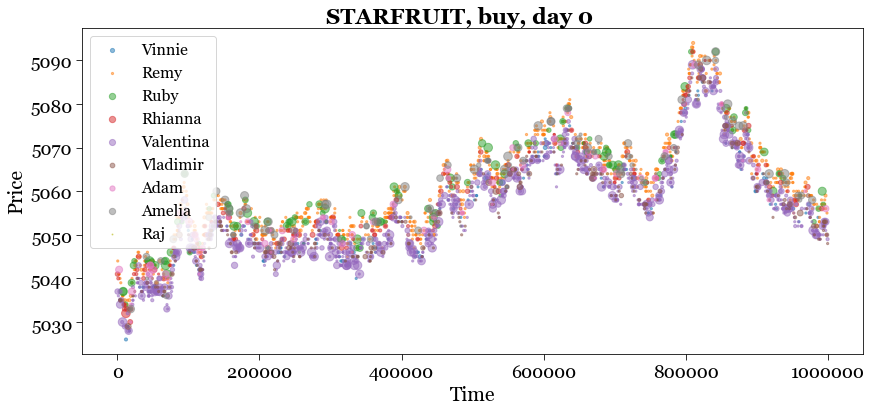

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


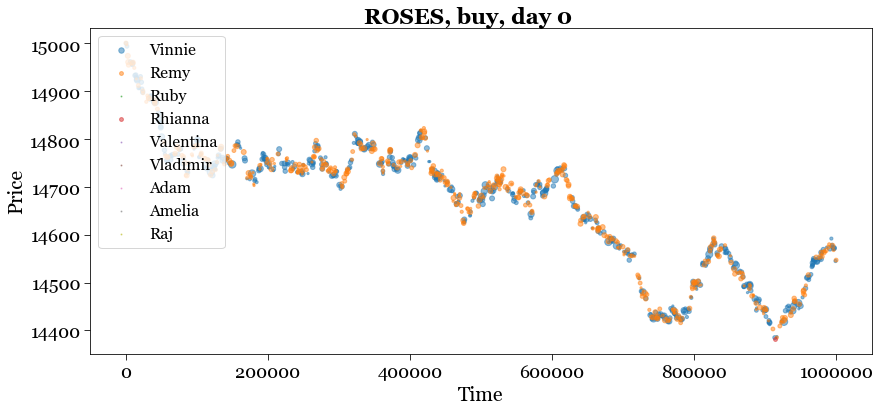

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


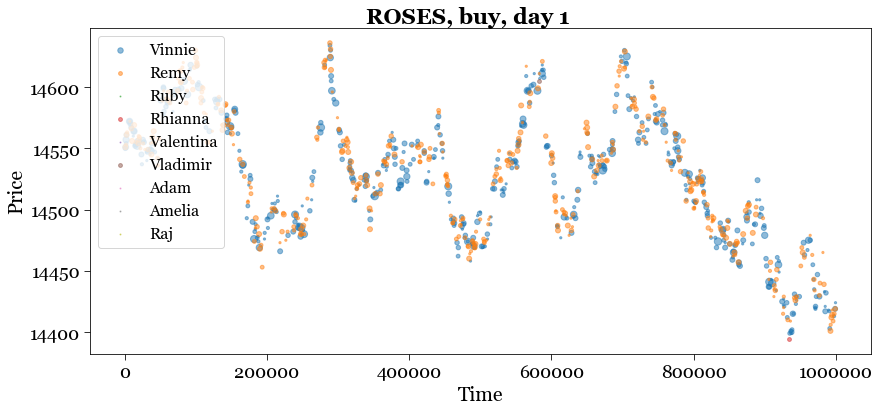

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


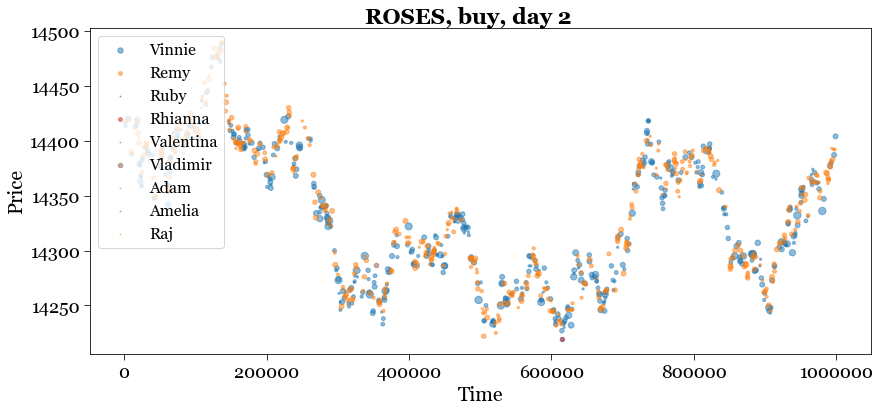

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


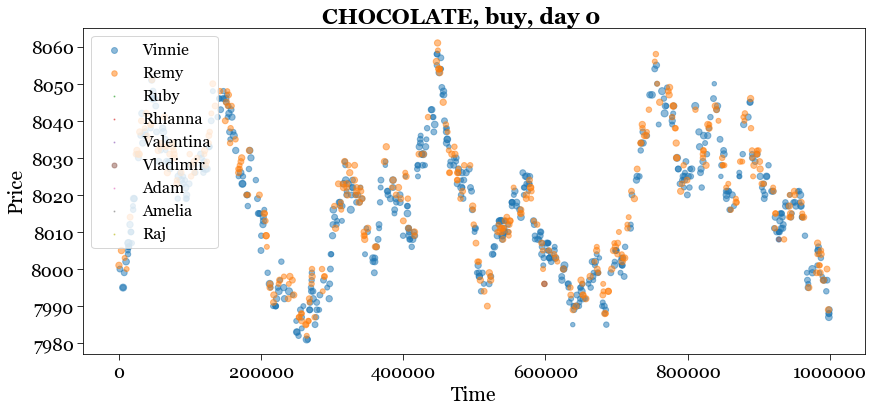

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


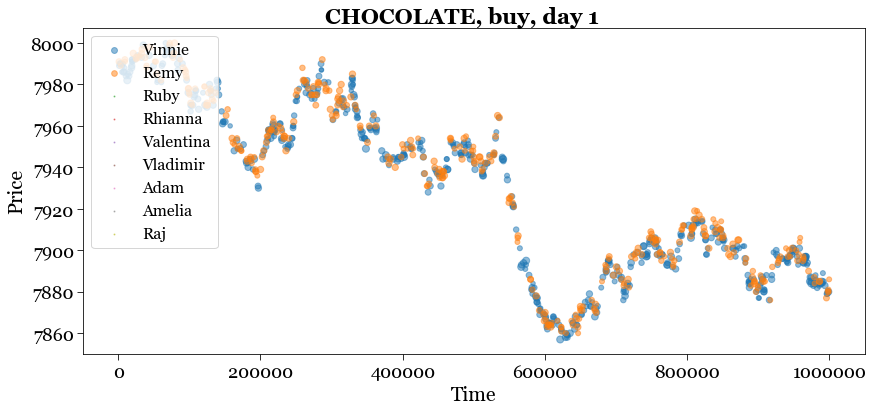

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


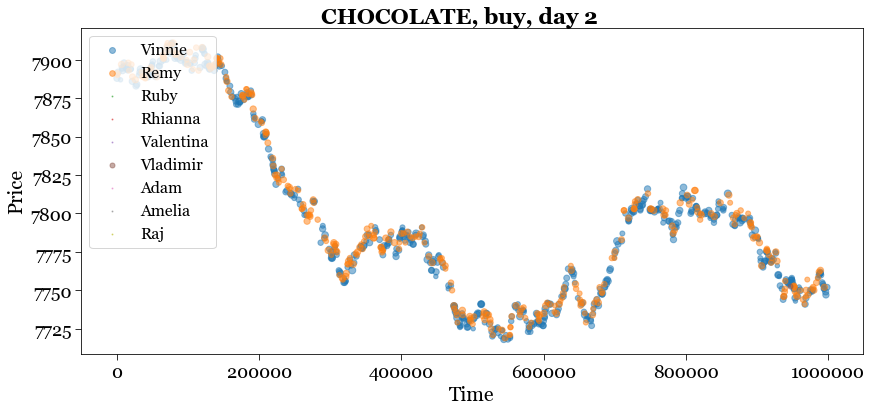

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


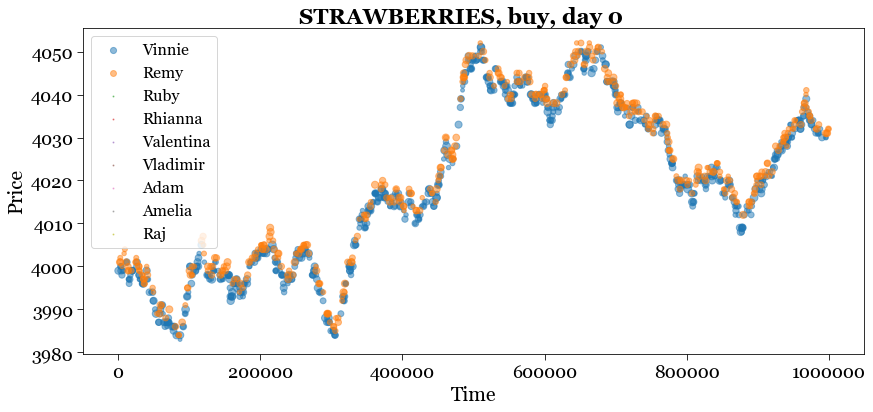

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


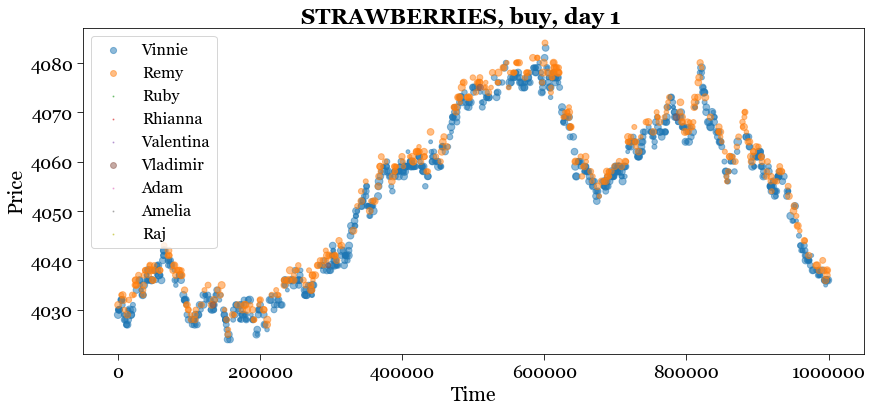

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


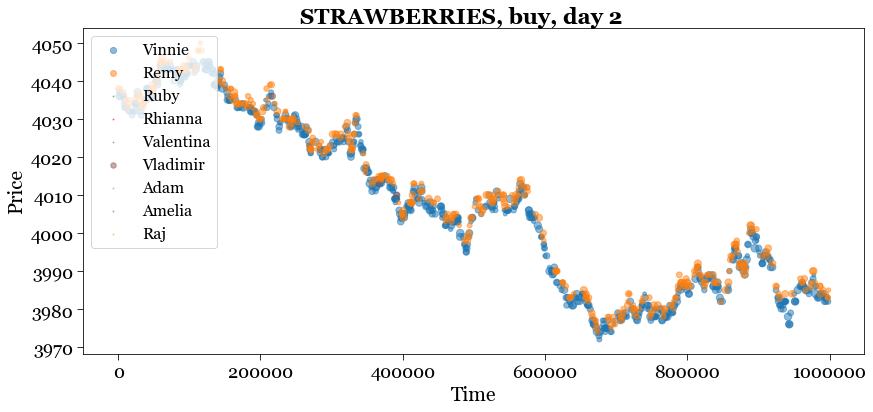

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


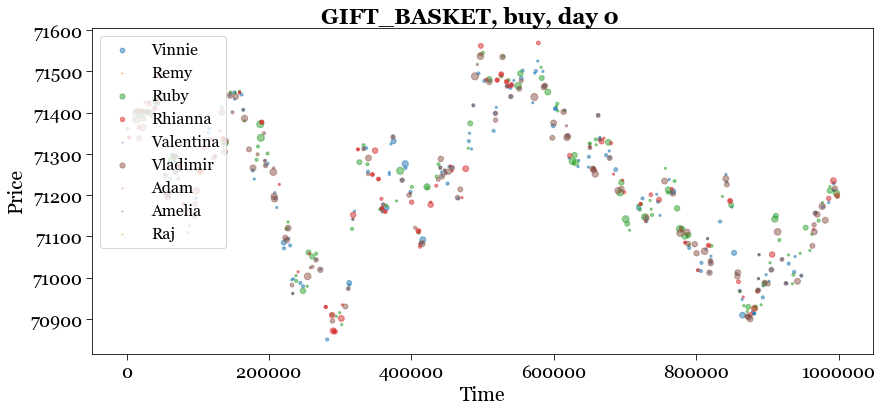

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


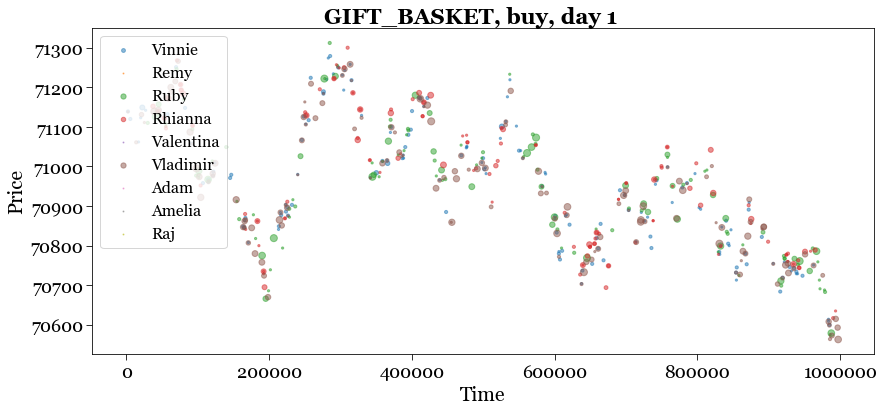

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


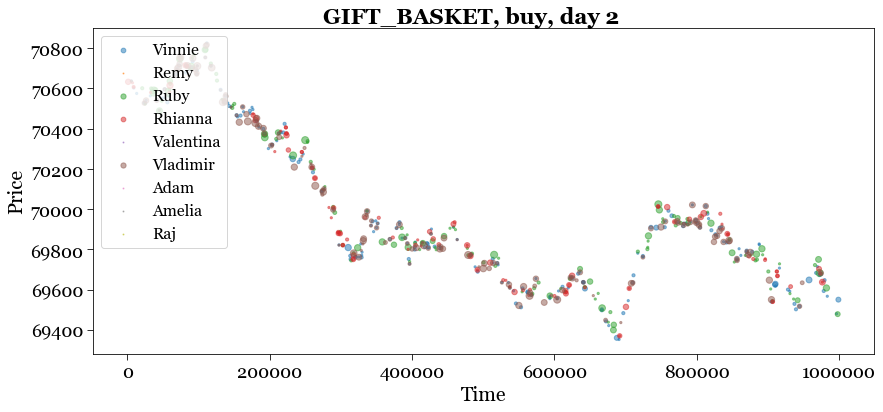

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


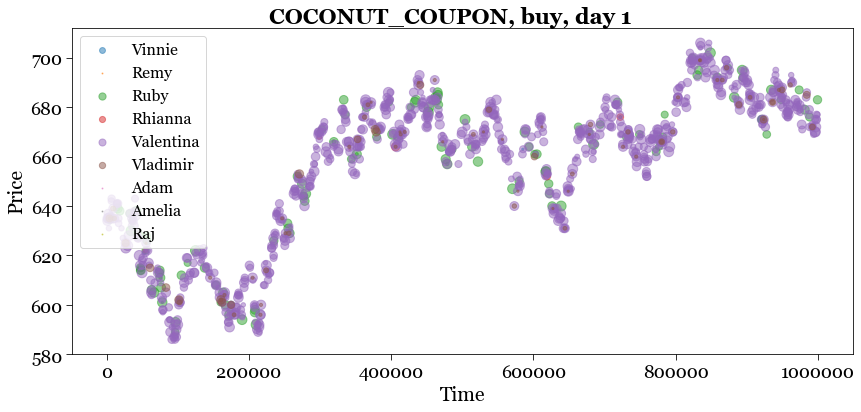

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


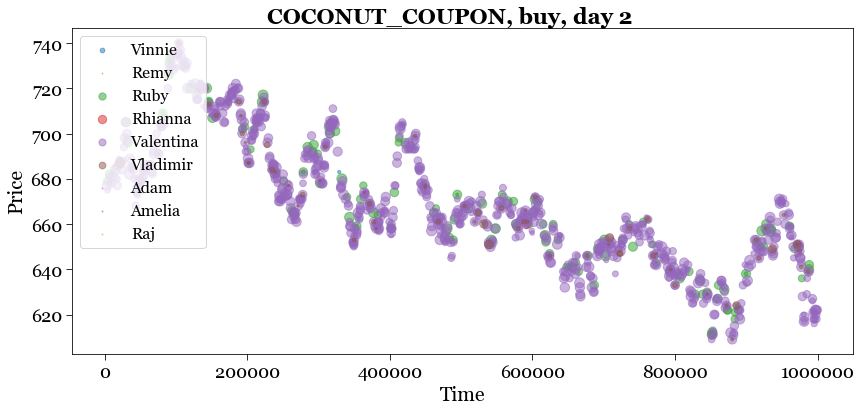

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


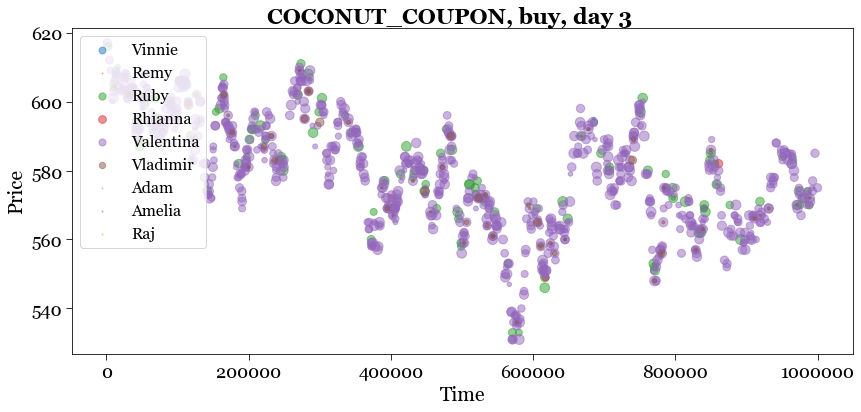

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


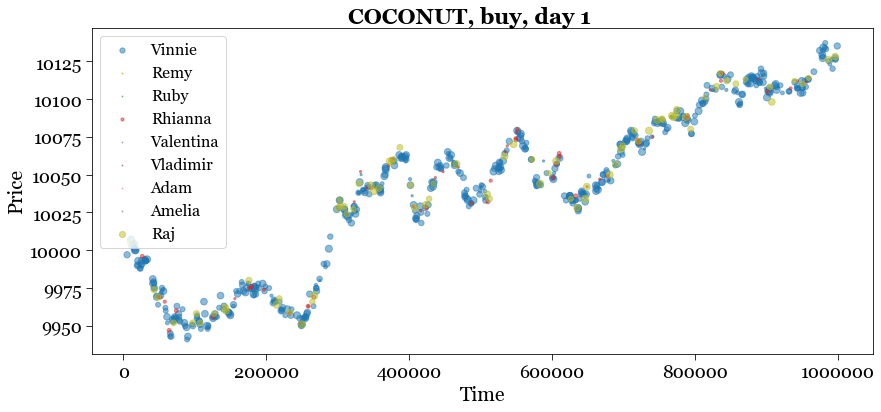

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


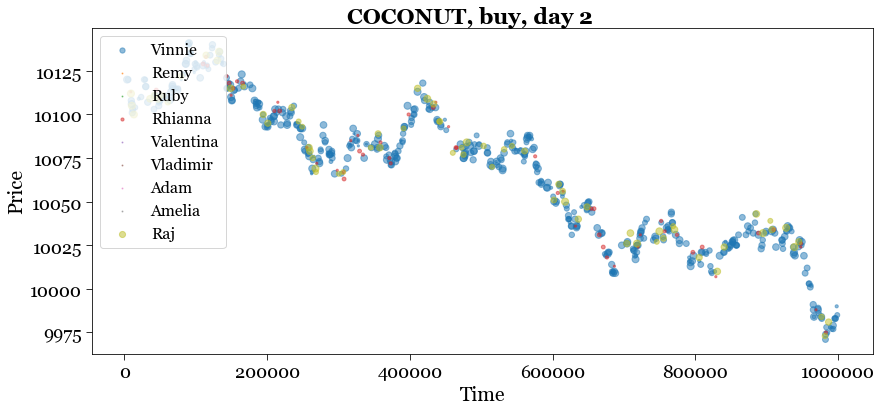

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1170514581.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


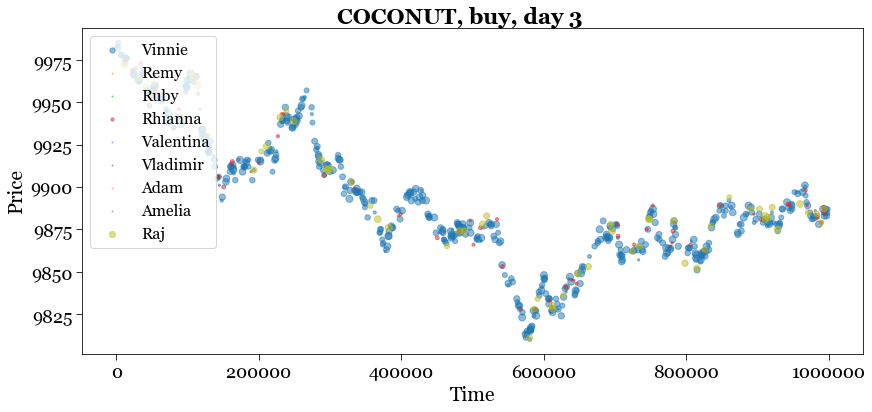

In [32]:
products = trade['symbol'].unique()
traders = trade['buyer'].unique()

for product in products:
    for prod_day in prod_days[product]:
        fig = plt.figure(figsize=(14, 6))
        ax = plt.gca()
        for it, trader in enumerate(traders):
            filtered_trade = trade[(trade['symbol'] == product) 
                                & (trade['buyer'] == trader)
                                & (trade['day'] == prod_day)]
            ax.scatter(filtered_trade['timestamp'], filtered_trade['price'], label=trader, alpha=0.5,
                        color=tableau_colors[it], marker='o', s=5*filtered_trade['quantity'])

        # Customize tick sizes
        ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
        # ax.set_xlim(0, 2000)
        # ax.set_ylim(0, 12000)
        ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
        ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
        ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
        ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))

        # Customize the plot (optional)
        plt.xlabel('Time', fontdict=font)
        plt.ylabel('Price', fontdict=font)
        plt.gcf().set_facecolor('white')
        fig.suptitle(f'{product}, buy, day {prod_day}', fontproperties=suptitle_font, y=0.93)
        plt.legend(loc='upper left', prop=legend_font)

        # plt.savefig(f'./../plots/R5_{product}_day{prod_day}_buy.png')
        # plt.savefig(f'./../plots/R5_{product}_day{prod_day}_buy.pdf')
        plt.show()

1. An overlayed time series plot of sellers
   * scatter of `price` sized by `quantity` colored by trader

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


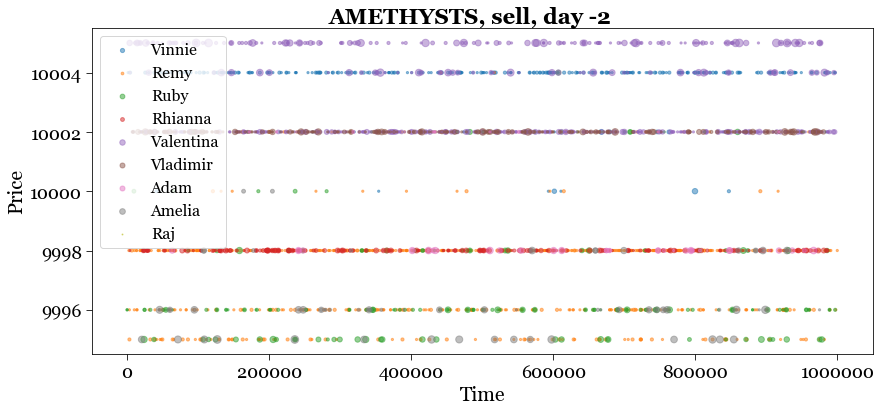

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


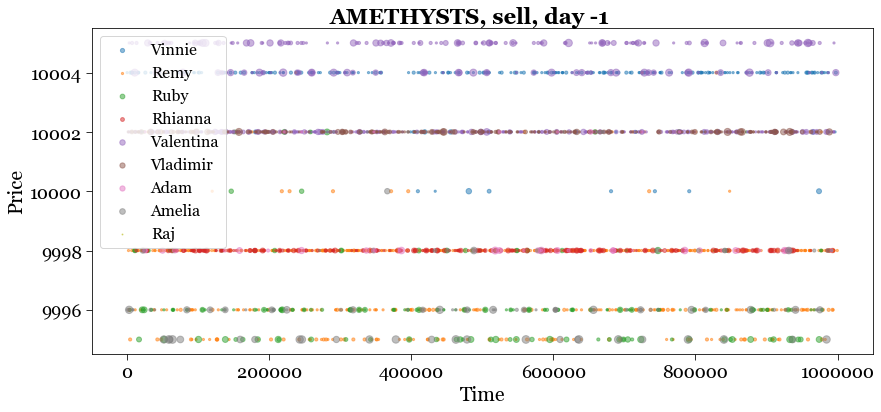

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


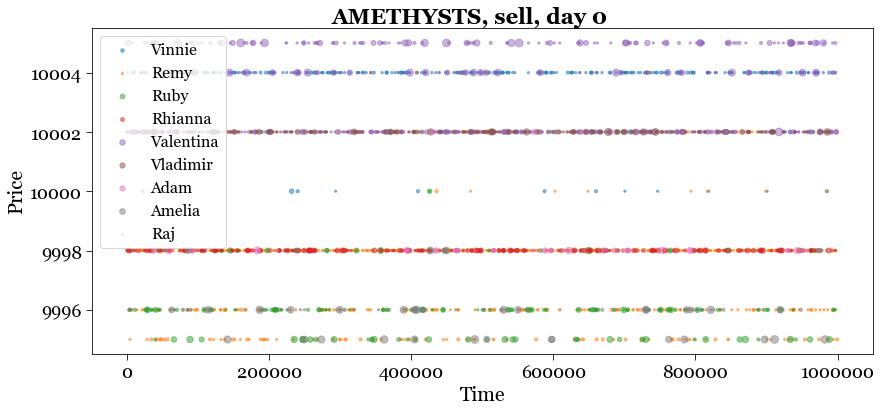

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


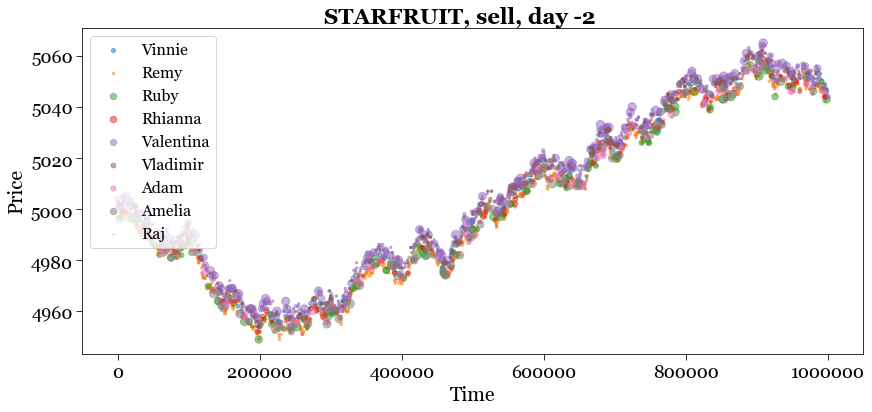

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


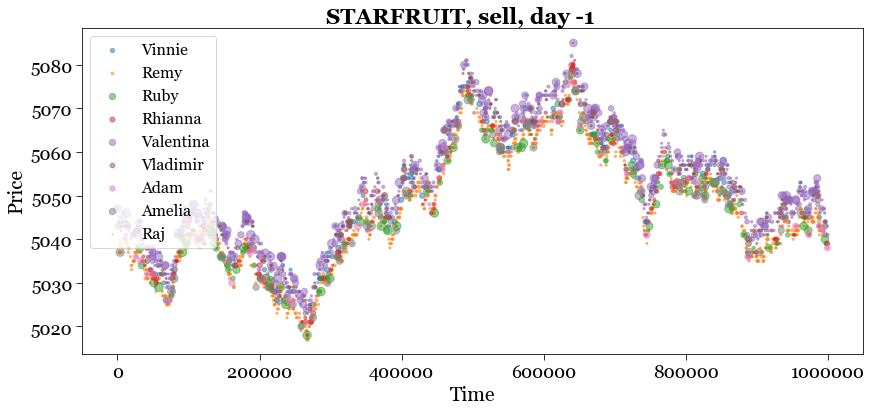

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


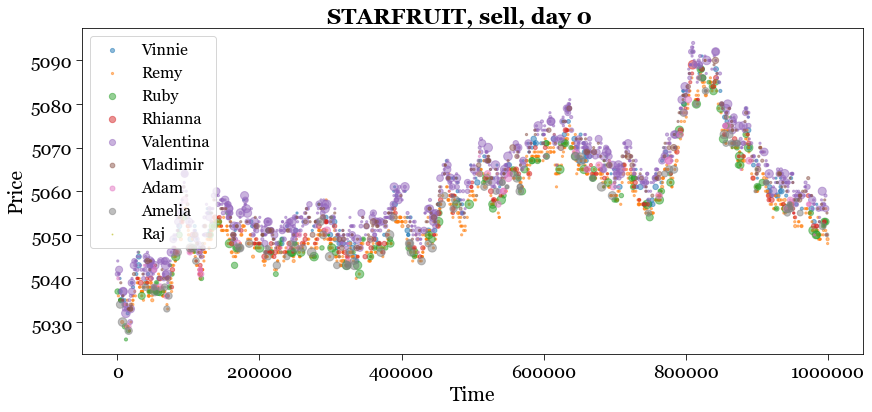

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


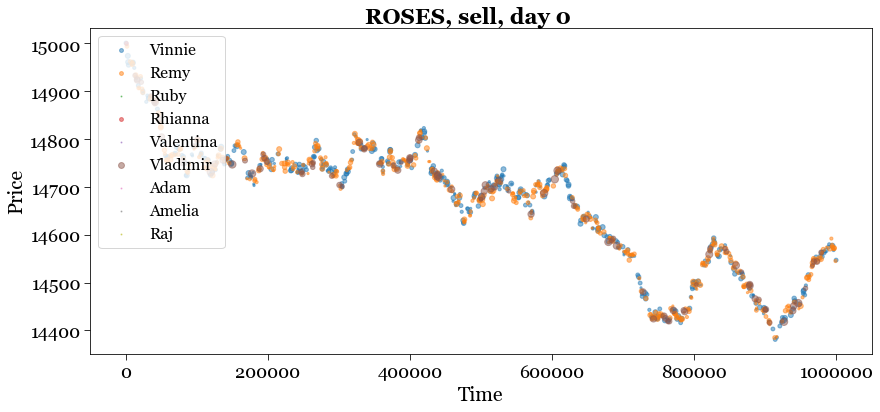

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


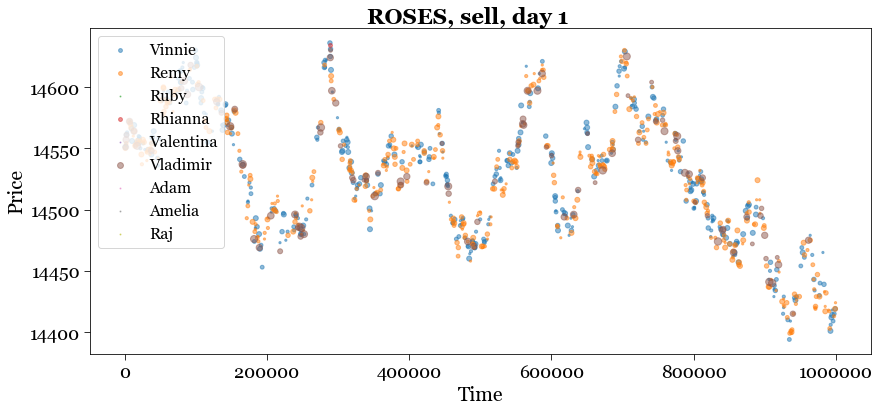

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


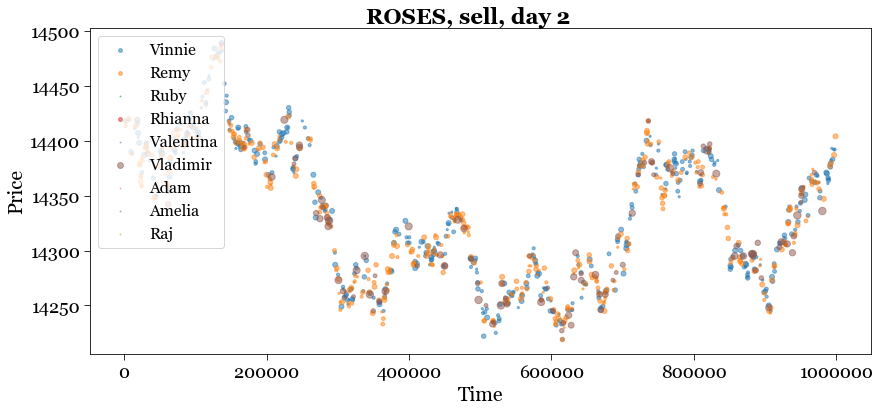

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


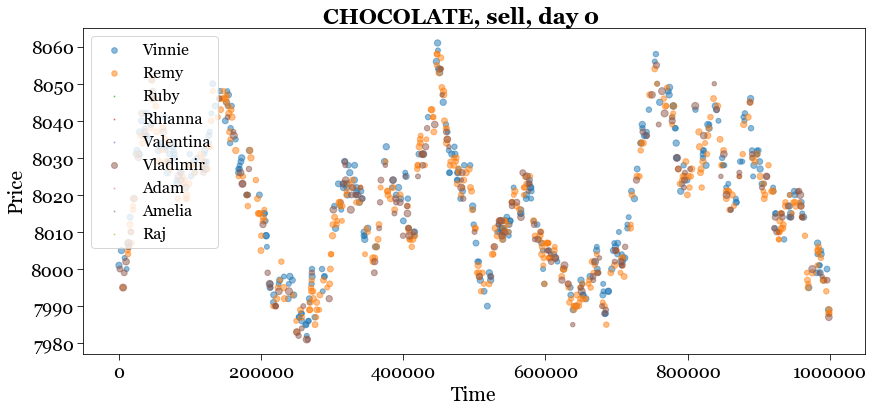

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


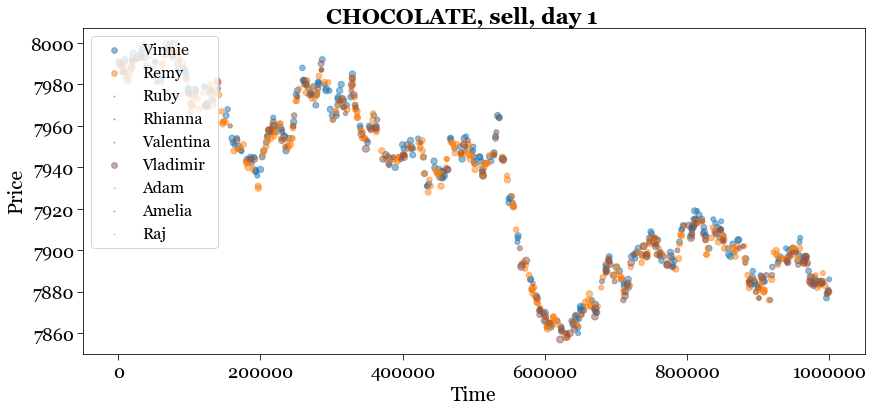

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


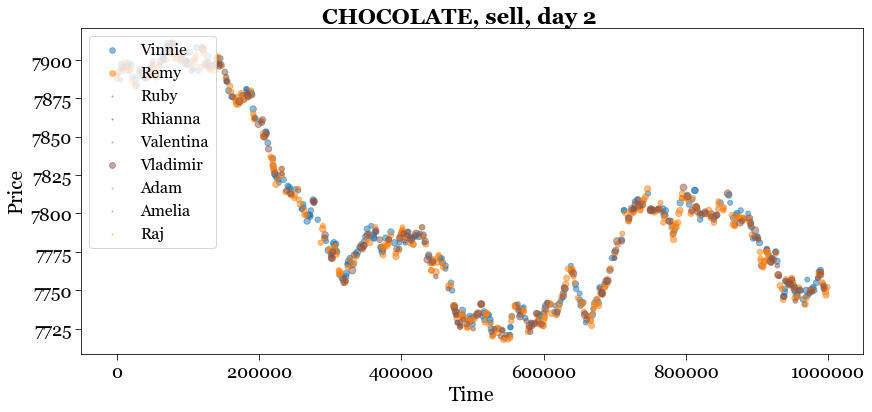

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


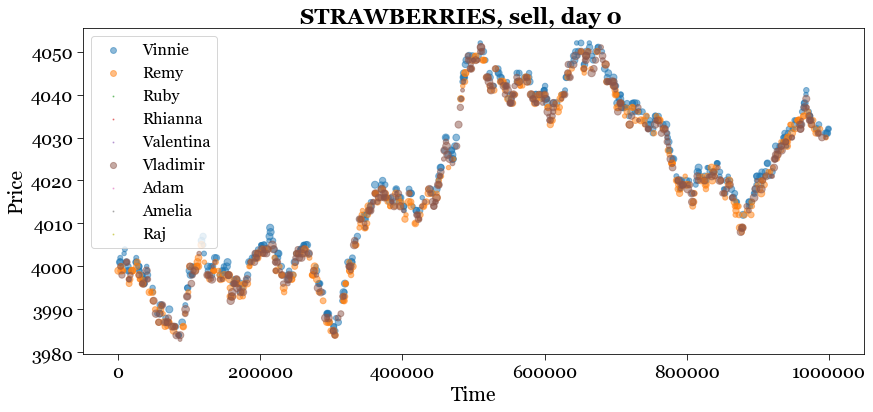

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


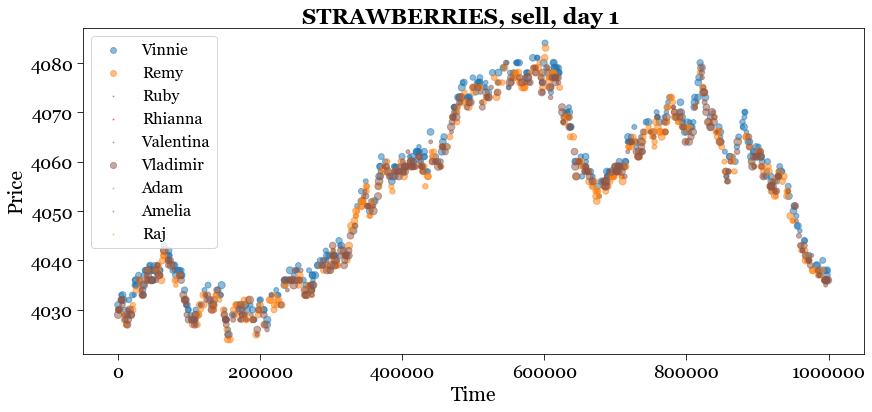

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


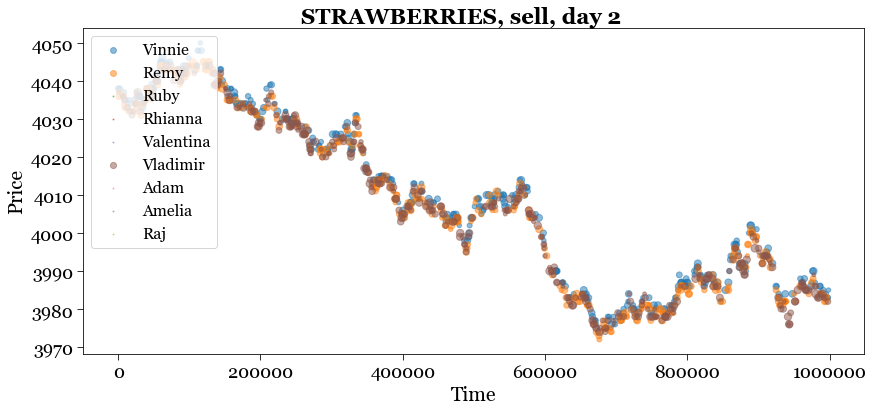

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


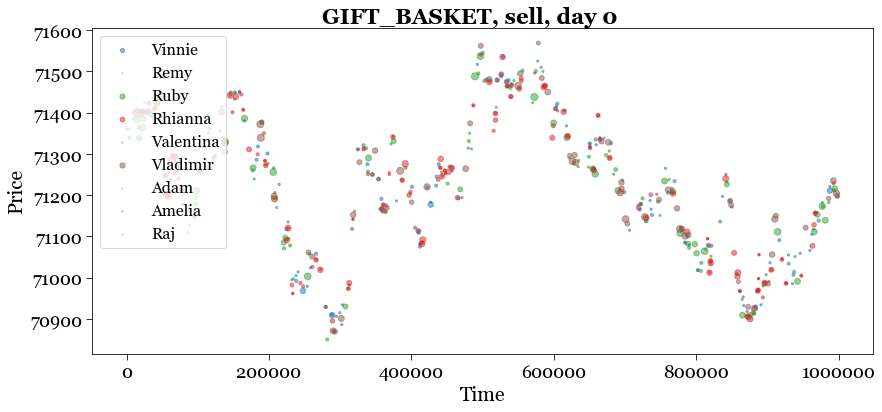

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


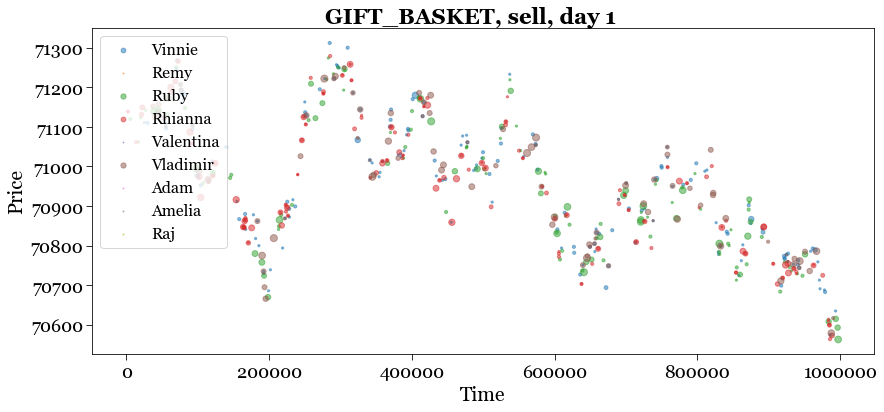

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


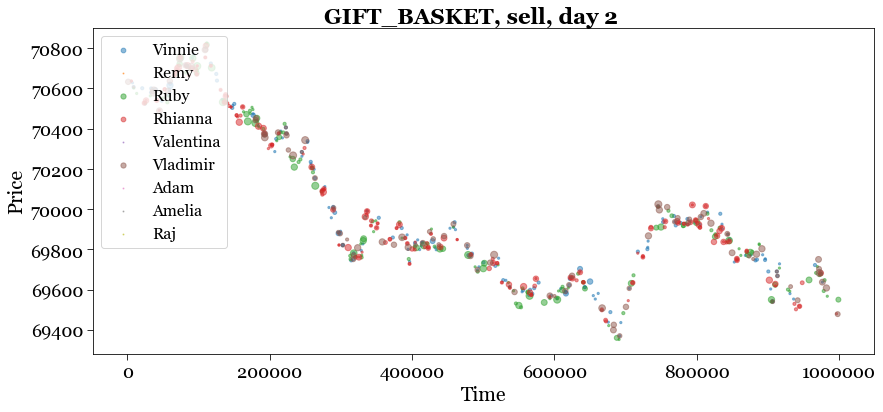

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


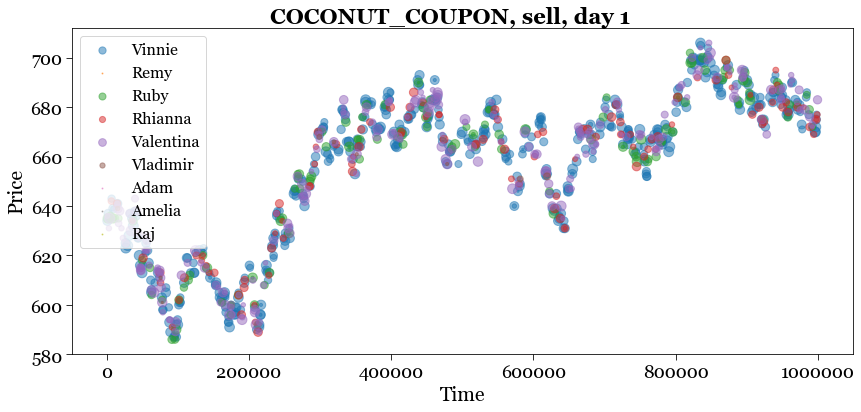

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


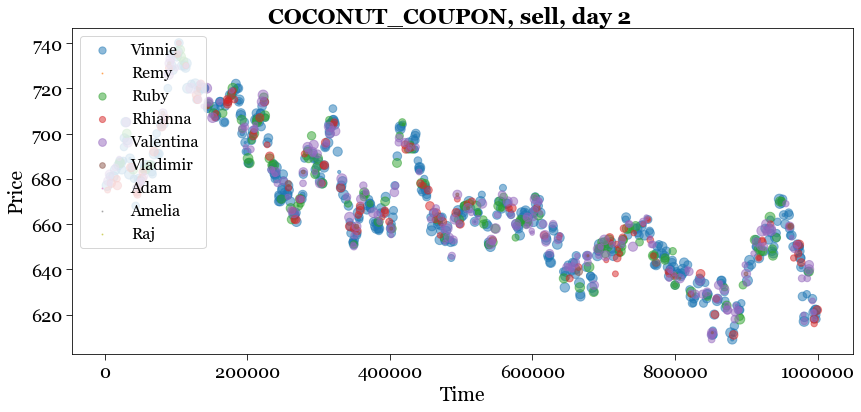

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


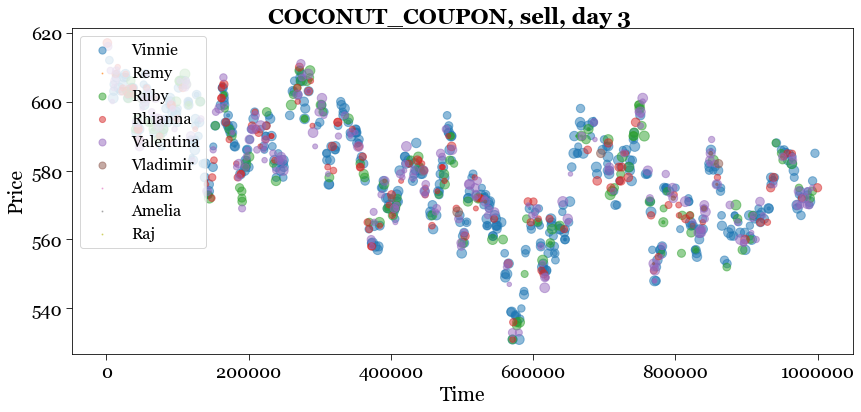

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


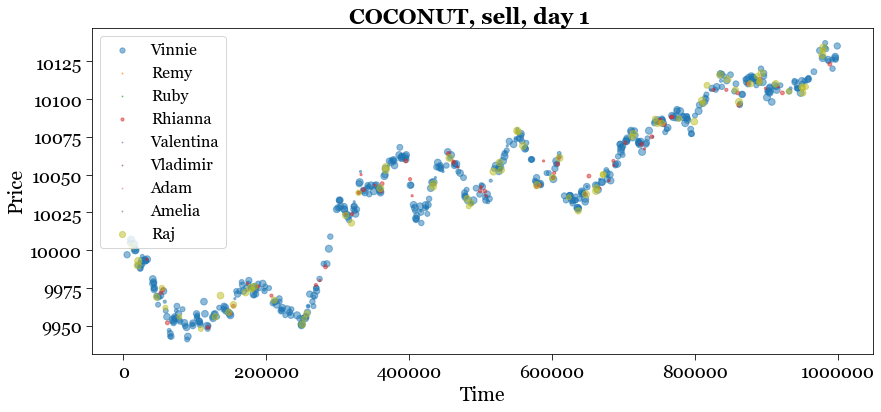

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


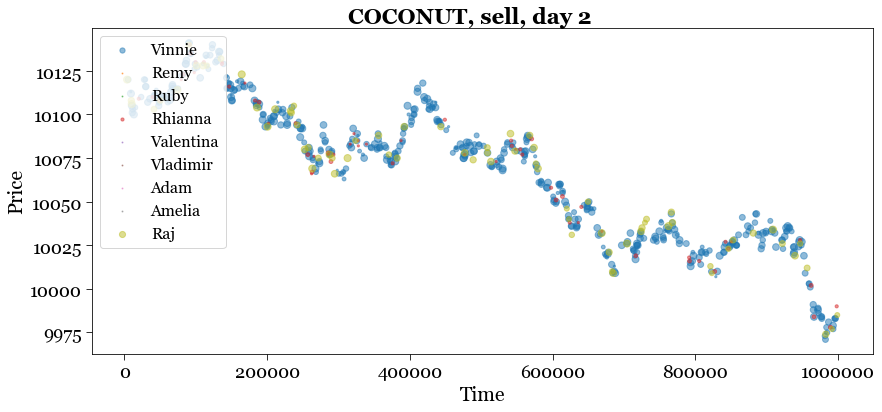

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1711296549.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


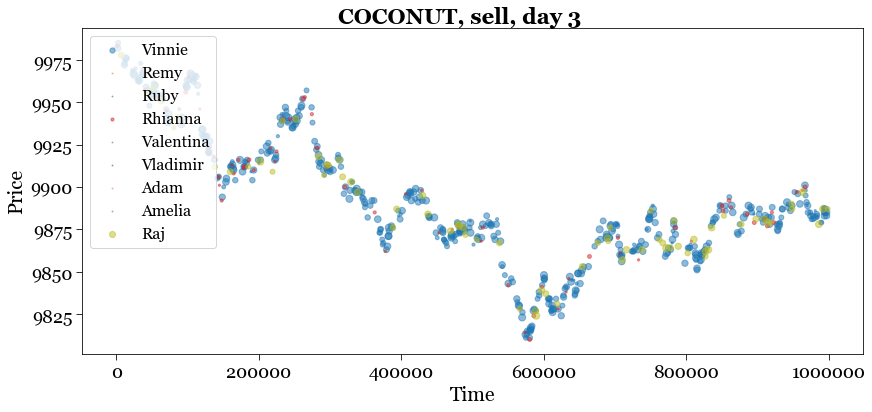

In [35]:
products = trade['symbol'].unique()
traders = trade['buyer'].unique() # keep color scheme the same

for product in products:
    for prod_day in prod_days[product]:
        fig = plt.figure(figsize=(14, 6))
        ax = plt.gca()
        for it, trader in enumerate(traders):
            filtered_trade = trade[(trade['symbol'] == product) 
                                & (trade['seller'] == trader)
                                & (trade['day'] == prod_day)]
            ax.scatter(filtered_trade['timestamp'], filtered_trade['price'], label=trader, alpha=0.5,
                        color=tableau_colors[it], marker='o', s=5*filtered_trade['quantity'])

        # Customize tick sizes
        ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
        # ax.set_xlim(0, 2000)
        # ax.set_ylim(0, 12000)
        ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
        ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
        ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
        ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))

        # Customize the plot (optional)
        plt.xlabel('Time', fontdict=font)
        plt.ylabel('Price', fontdict=font)
        plt.gcf().set_facecolor('white')
        fig.suptitle(f'{product}, sell, day {prod_day}', fontproperties=suptitle_font, y=0.93)
        plt.legend(loc='upper left', prop=legend_font)

        # plt.savefig(f'./../plots/R5_{product}_day{prod_day}_sell.png')
        # plt.savefig(f'./../plots/R5_{product}_day{prod_day}_sell.pdf')
        plt.show()

A plot of overlayed individual buys and sells
   * scatter of `buyer` trade, scaled by `quantity`
   * scatter of `seller` trade, scaled by `quantity`


/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


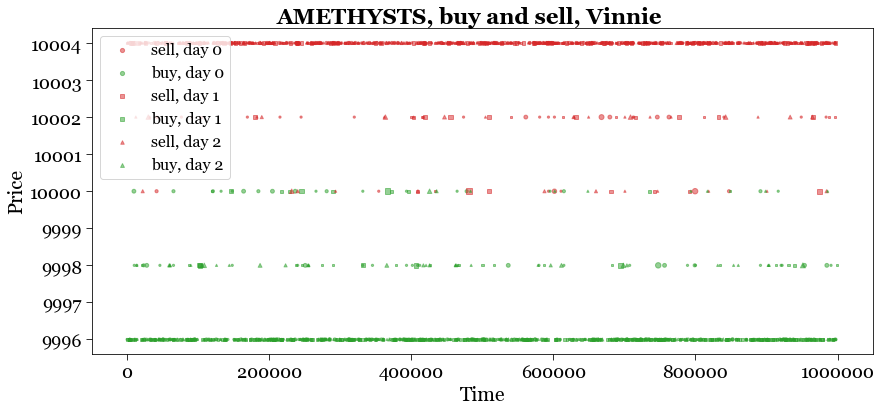

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


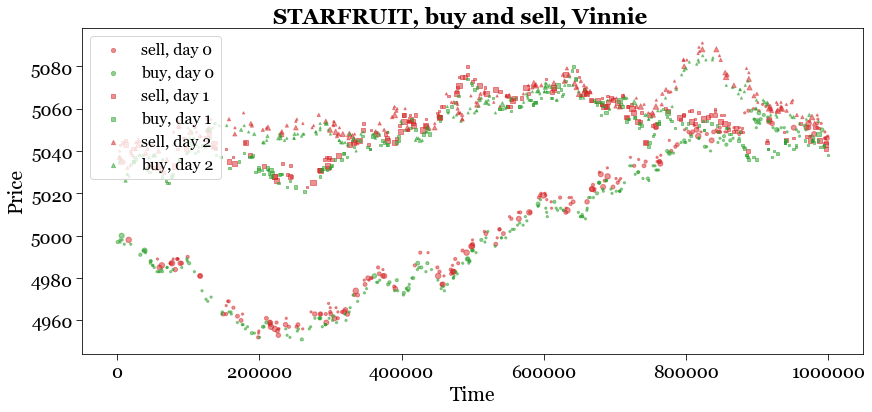

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


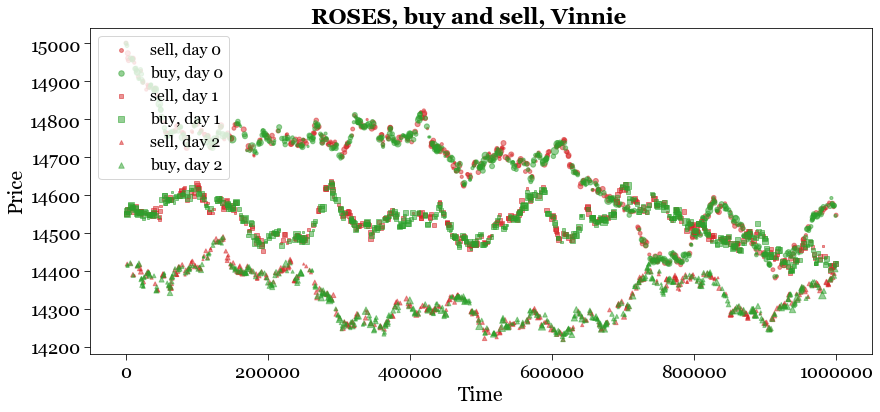

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


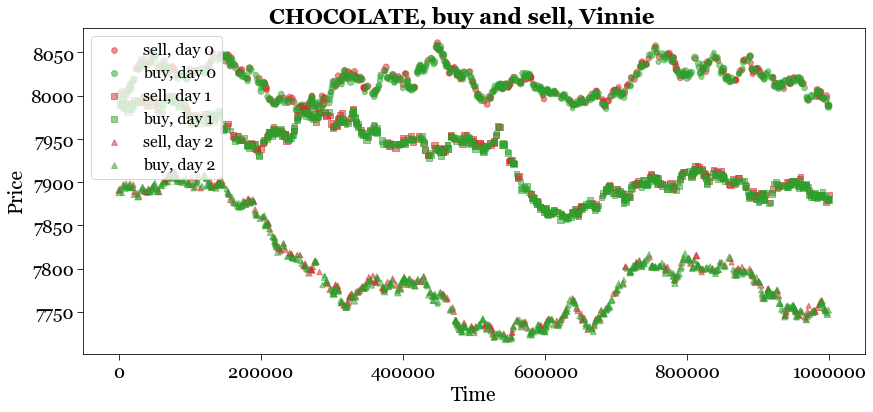

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


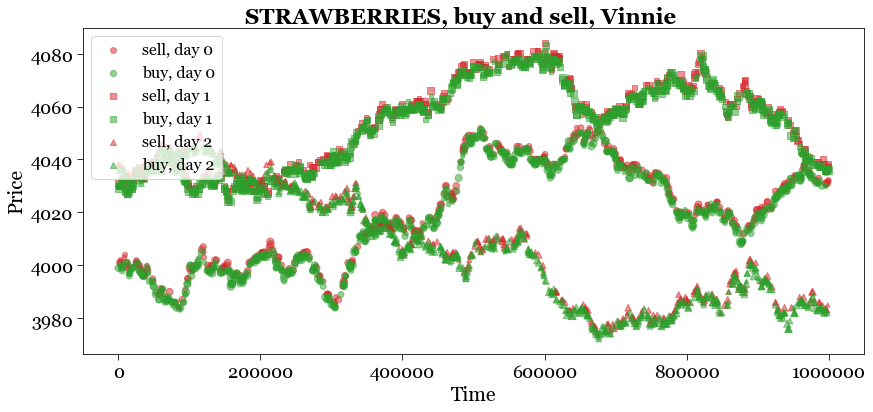

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


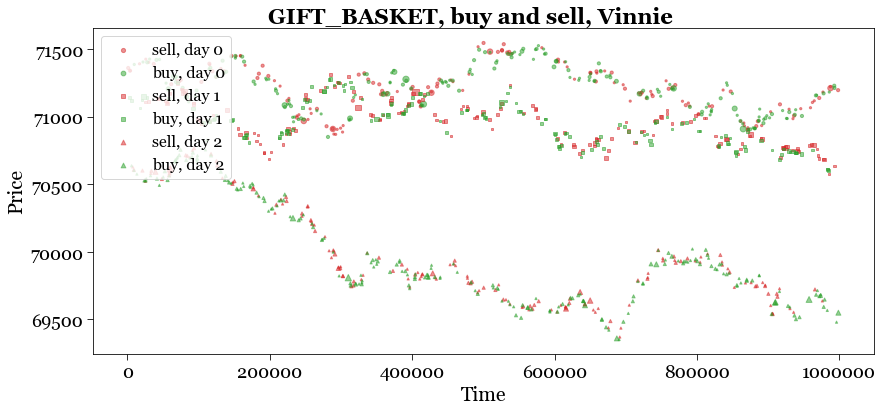

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


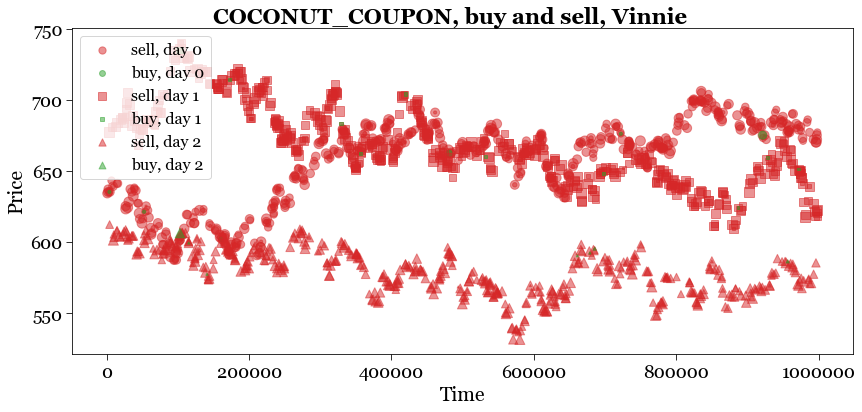

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


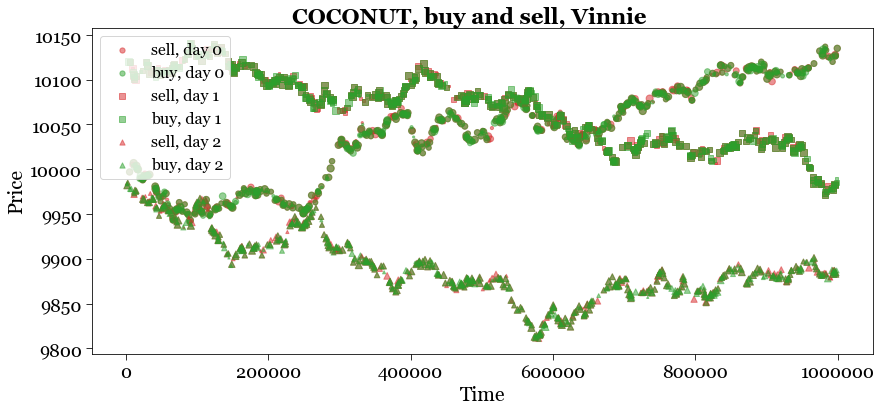

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


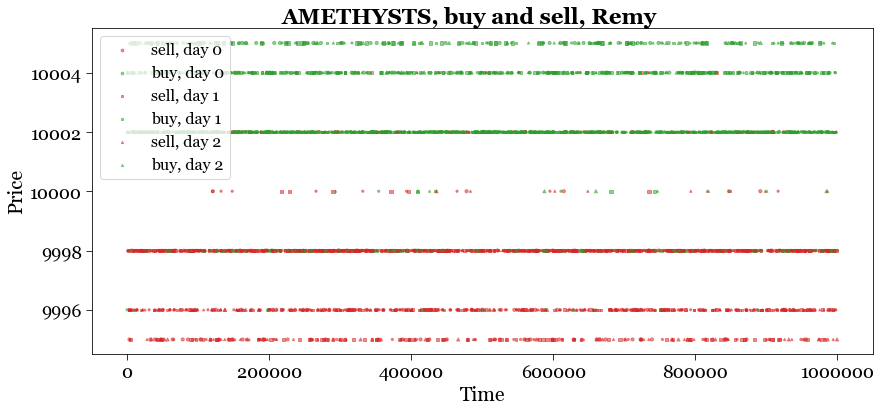

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


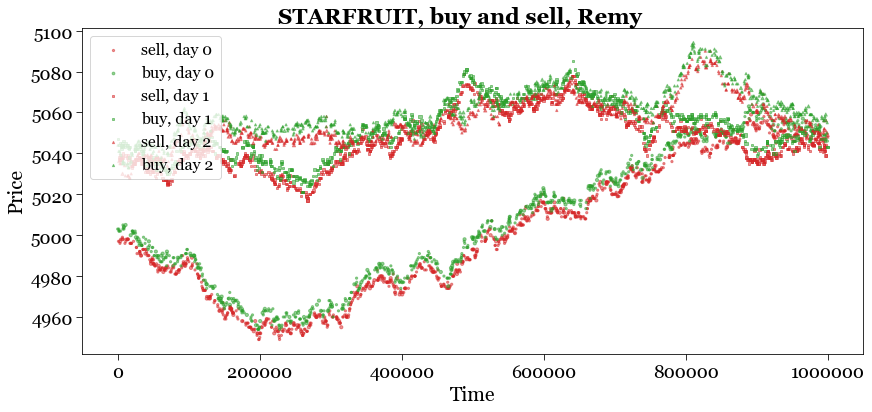

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


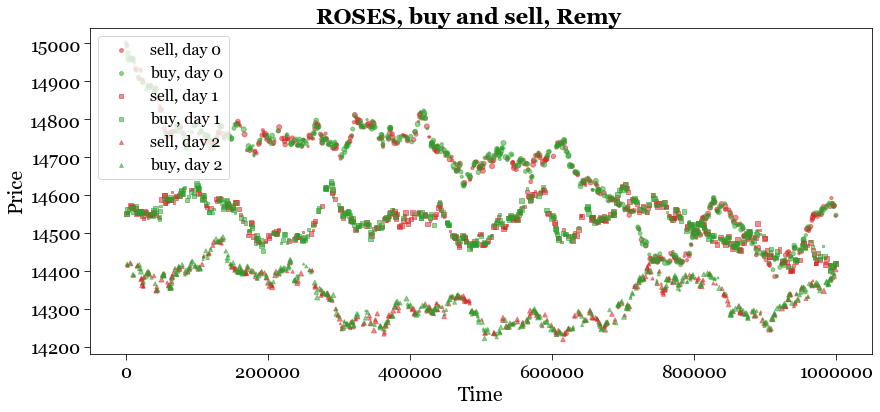

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


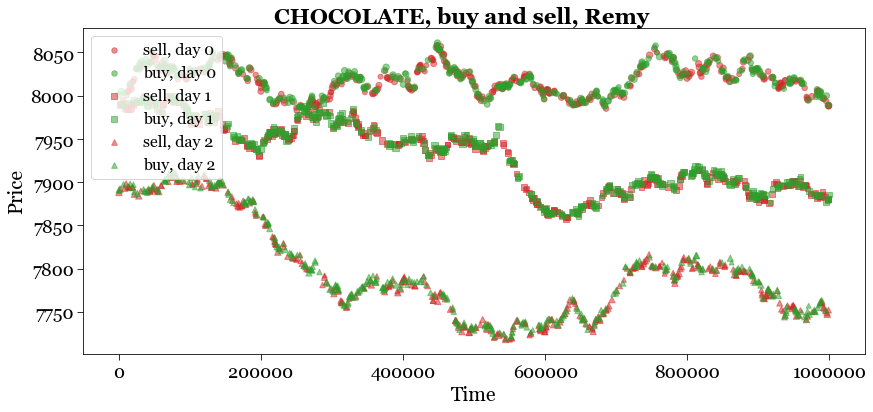

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


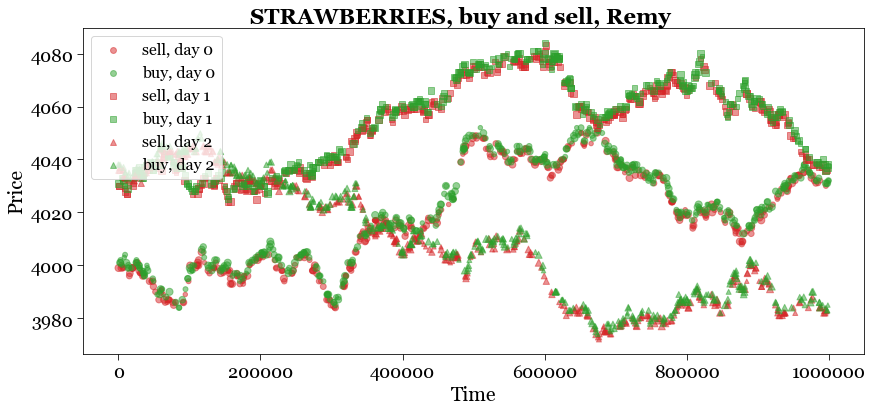

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


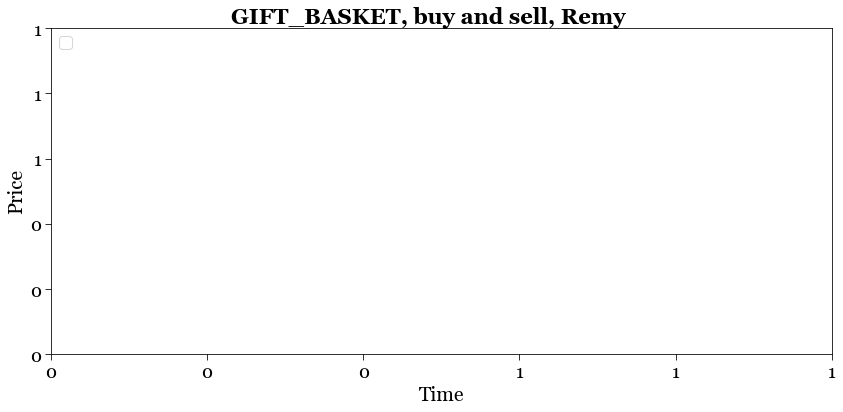

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


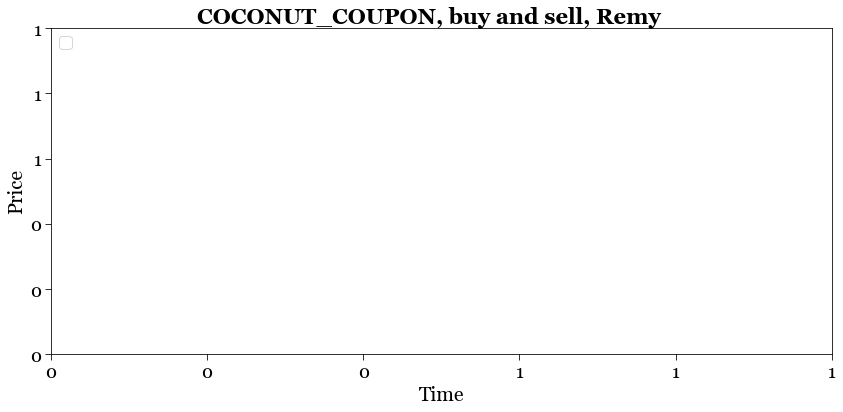

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


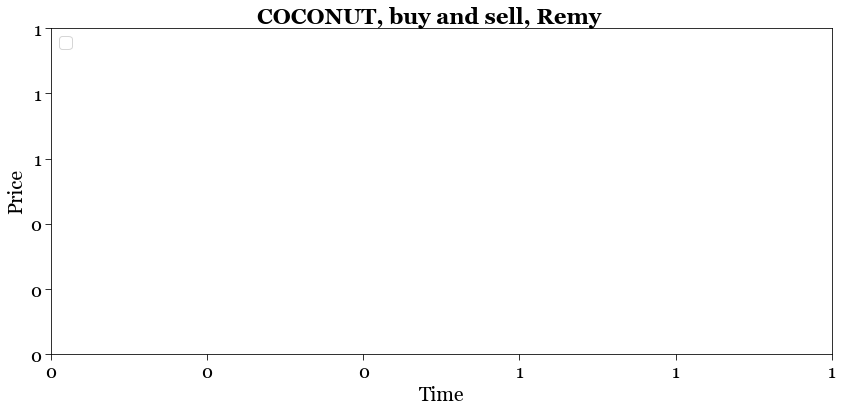

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


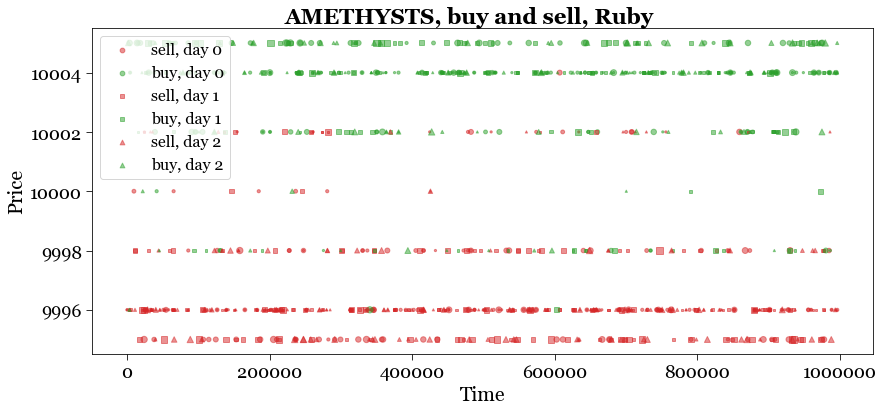

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


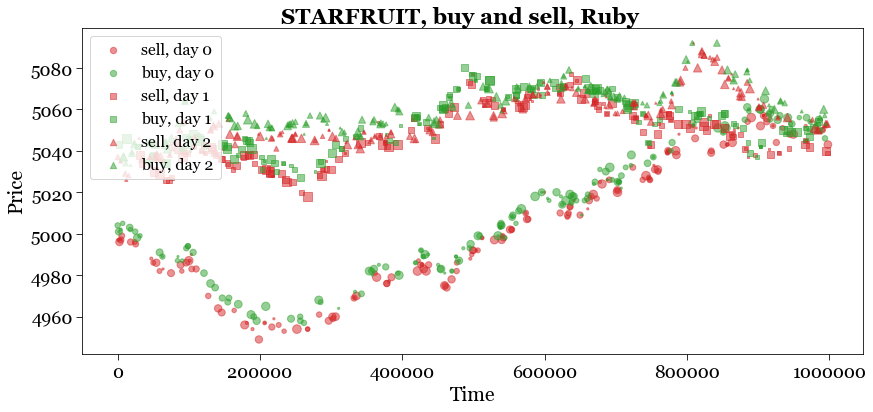

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


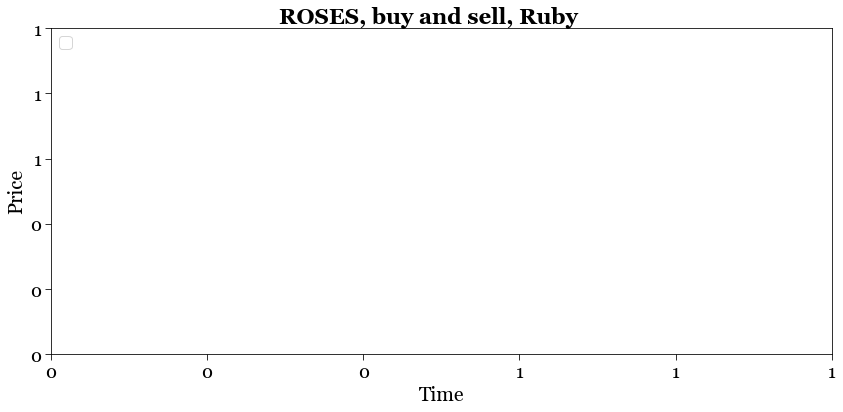

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


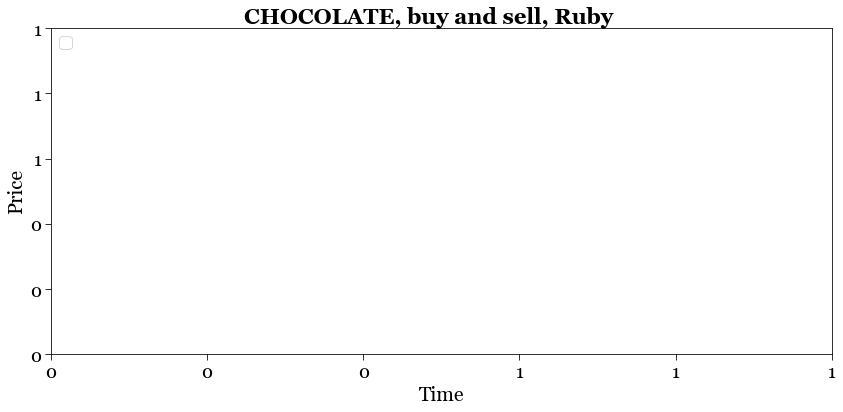

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


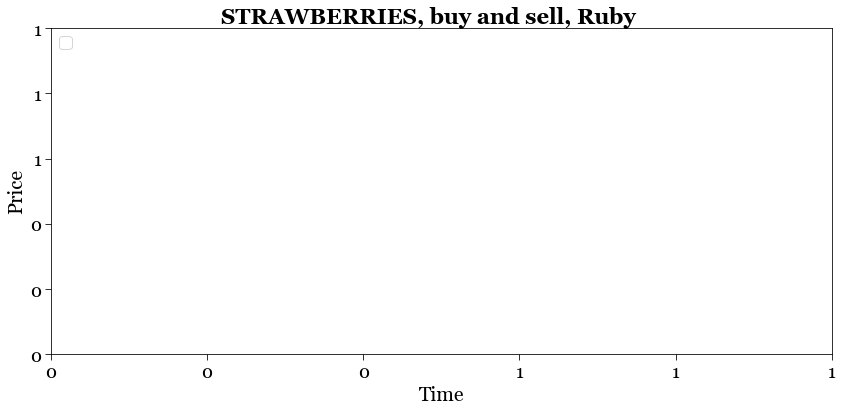

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


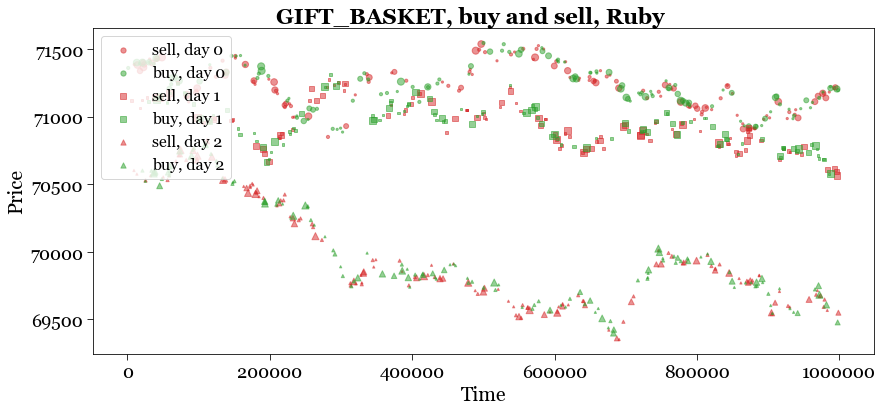

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


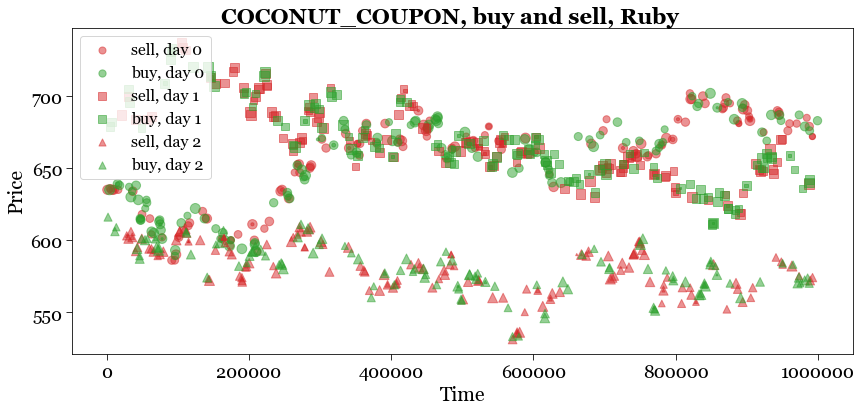

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


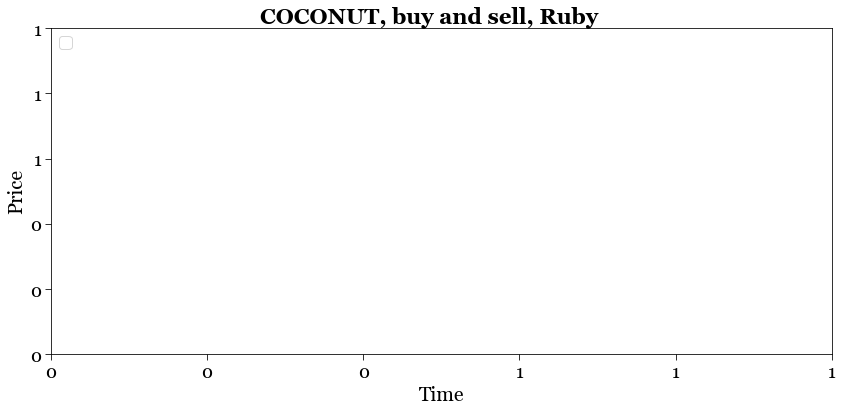

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


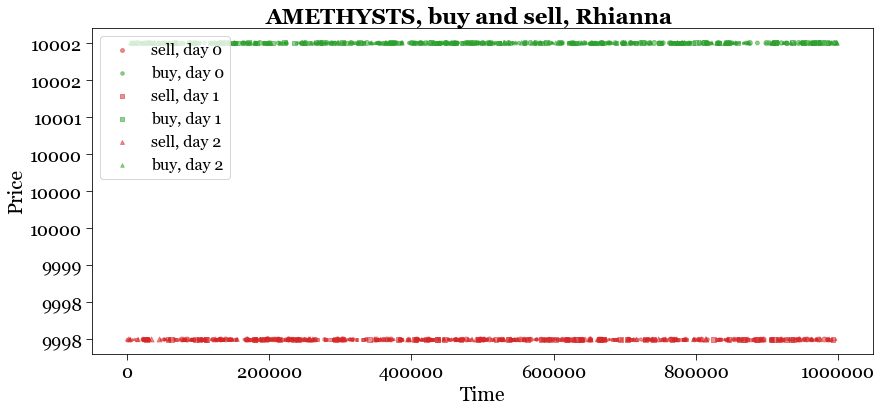

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


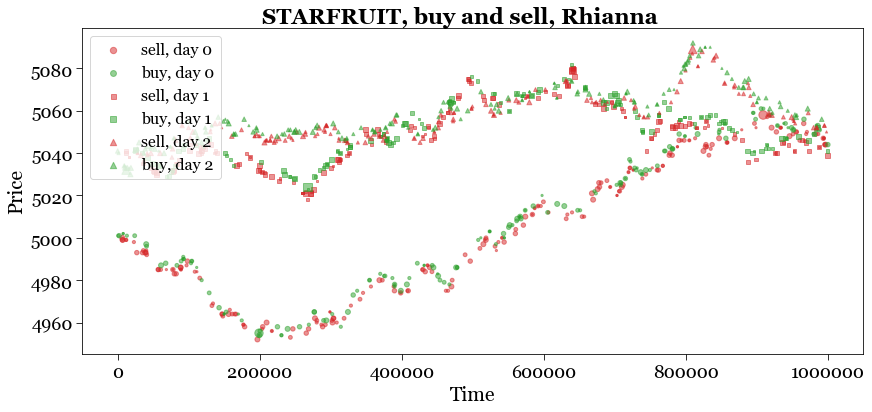

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


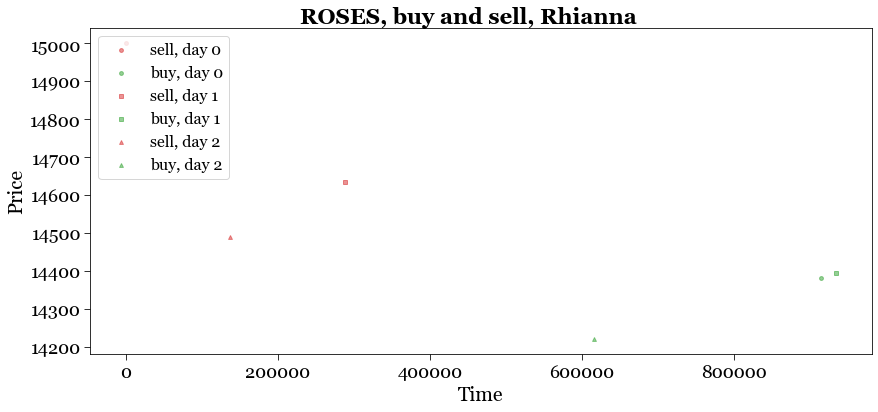

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


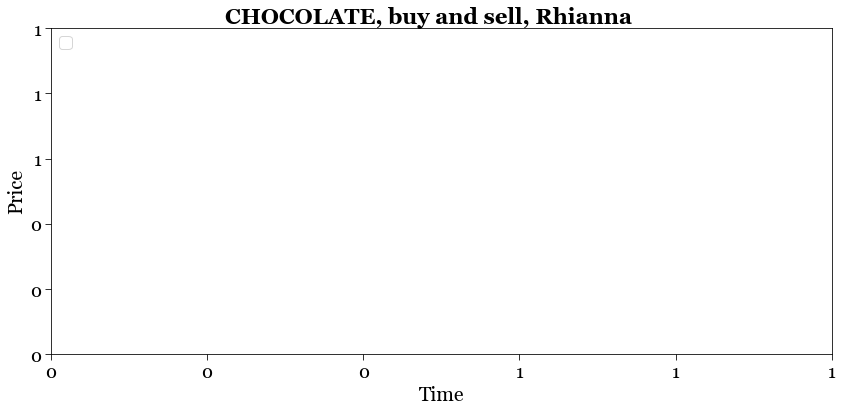

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


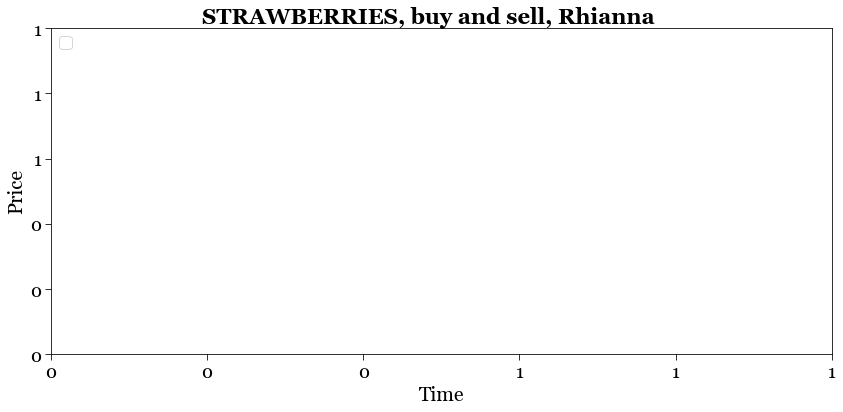

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


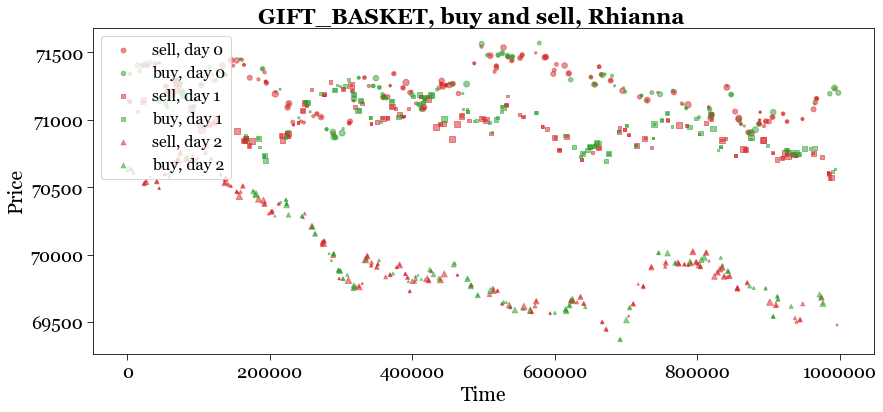

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


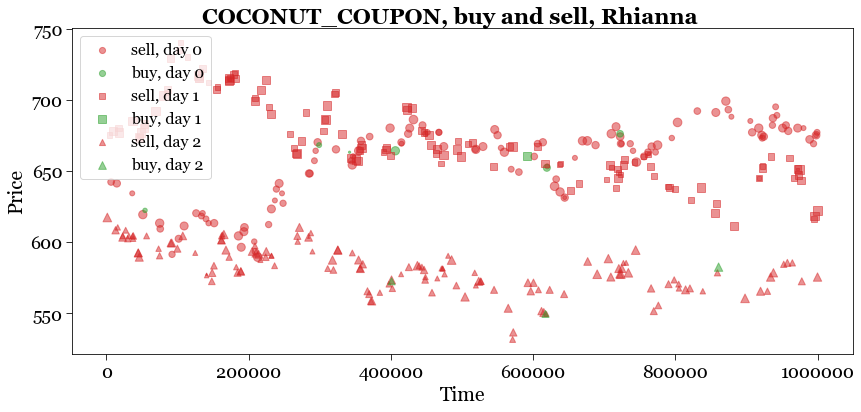

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


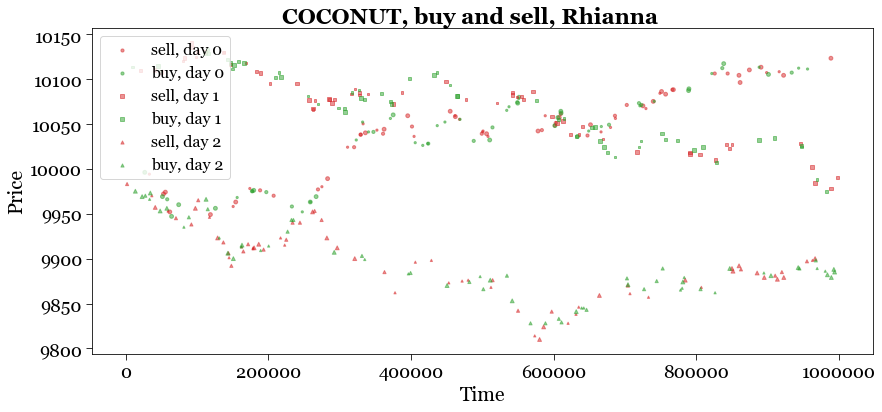

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


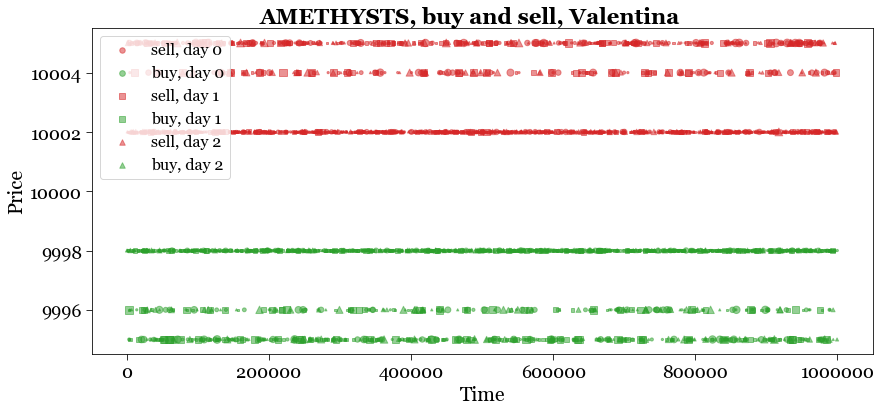

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


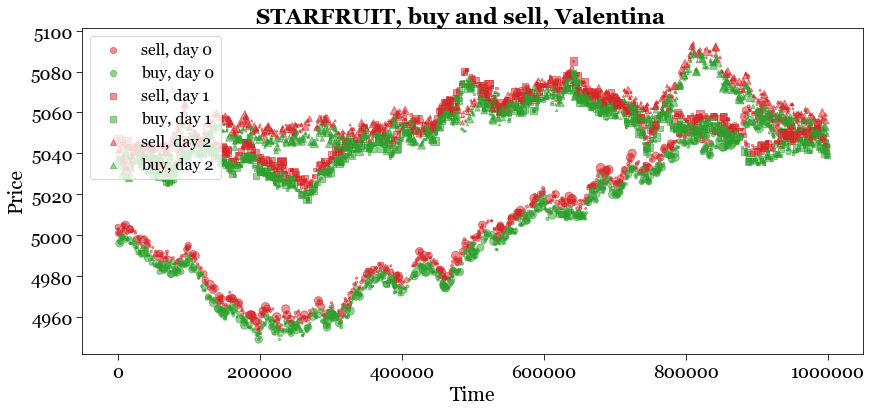

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


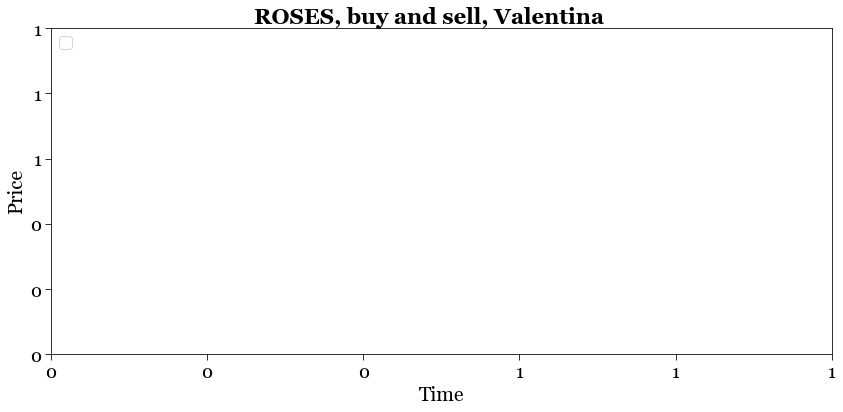

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


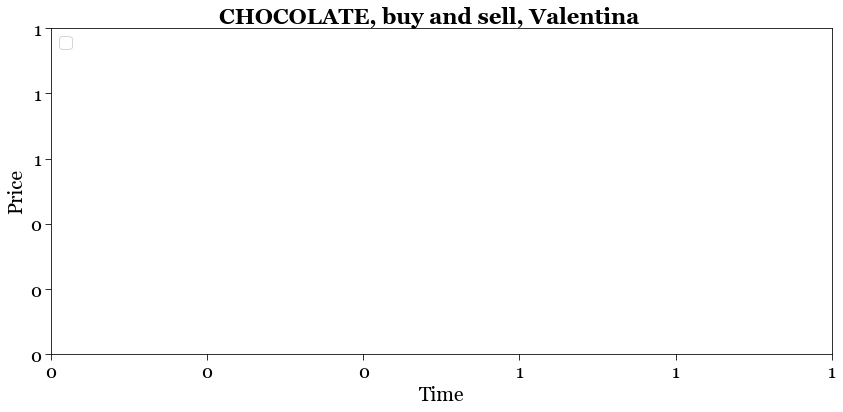

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


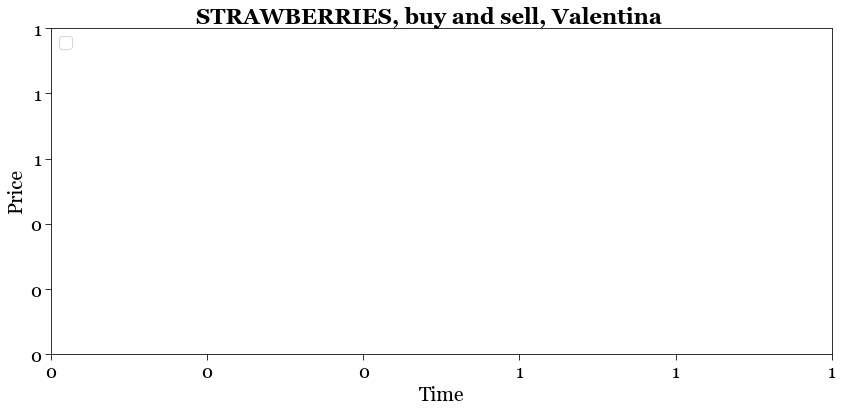

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


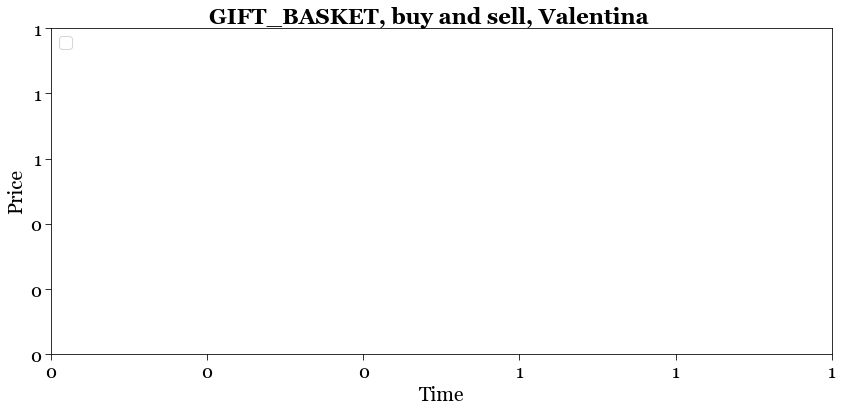

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


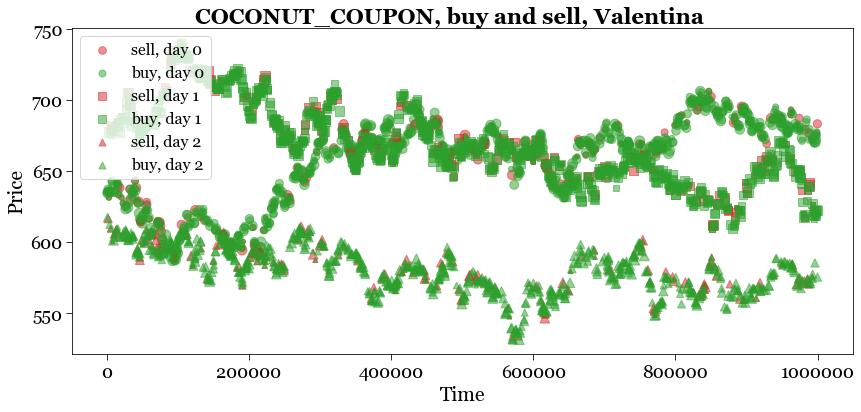

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


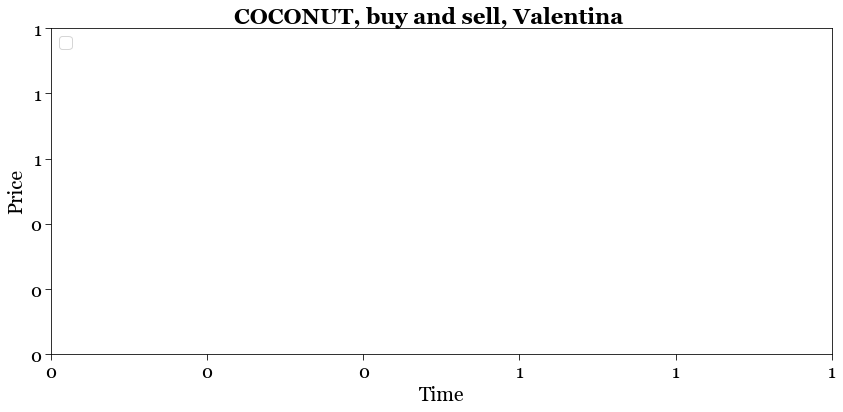

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


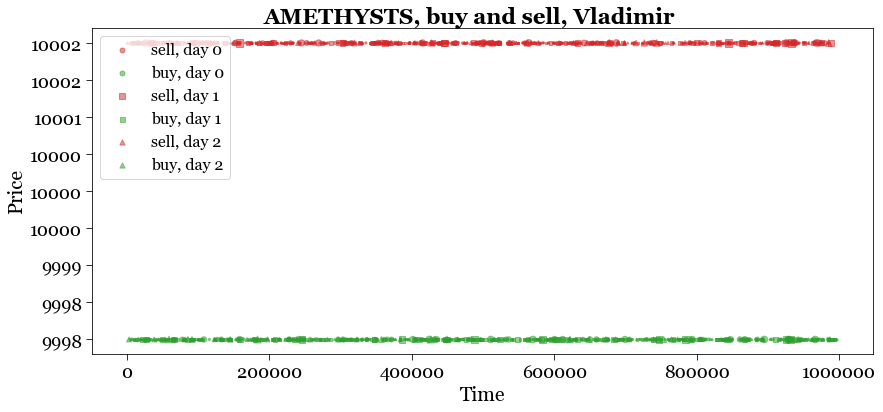

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


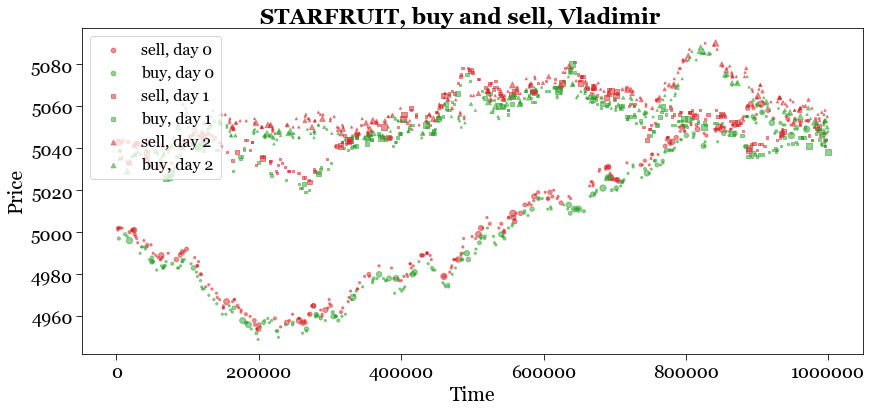

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


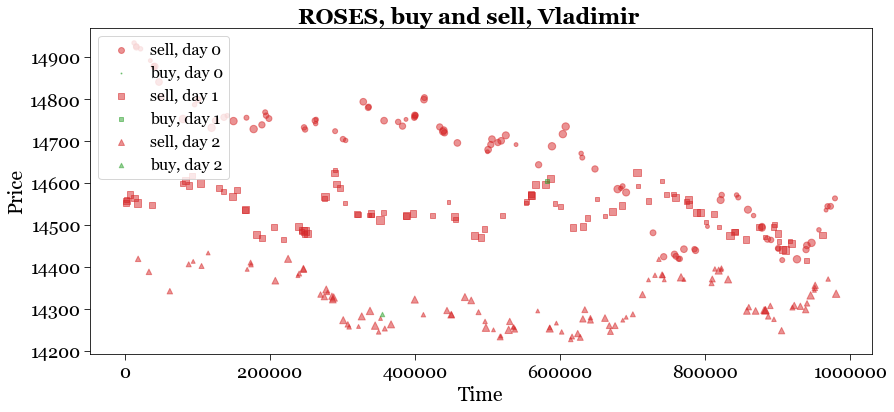

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


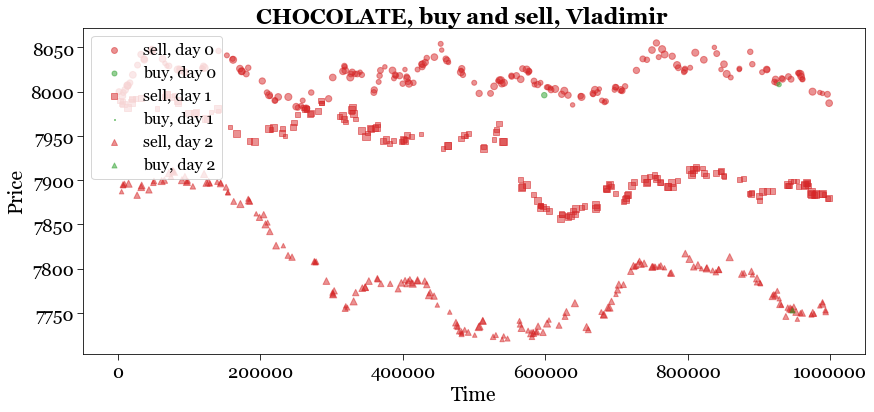

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


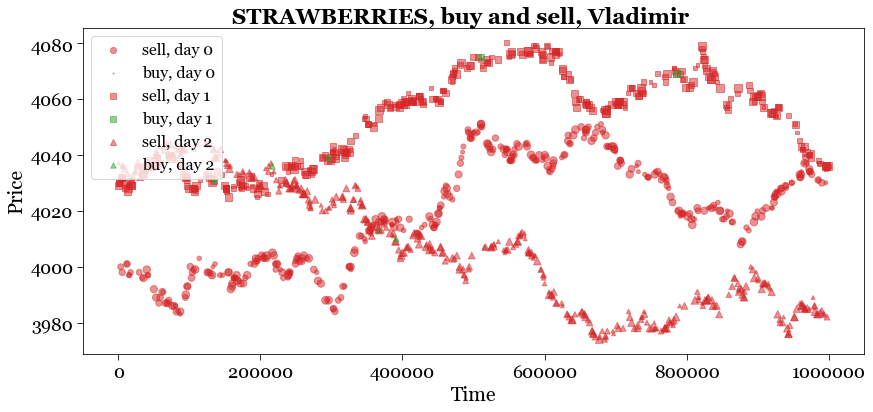

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


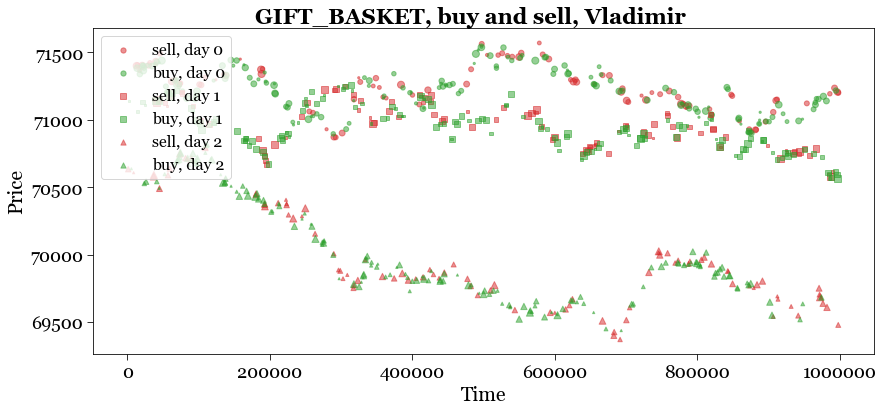

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


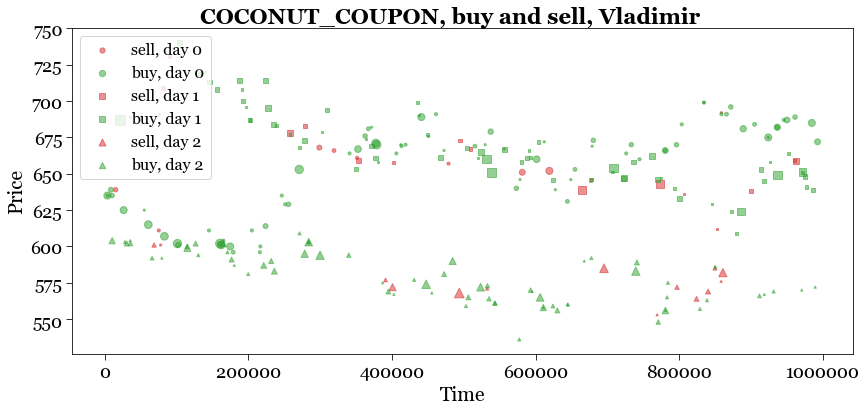

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


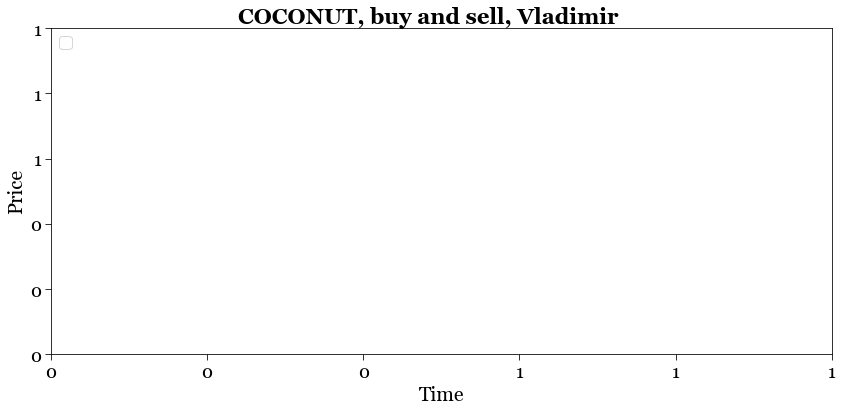

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


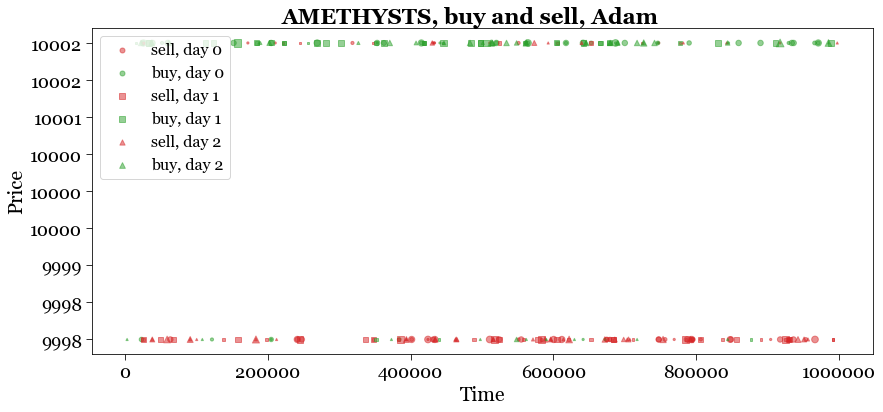

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


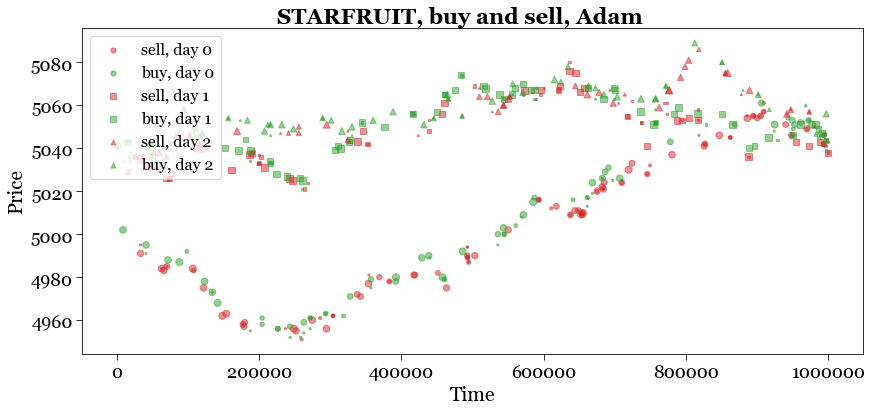

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


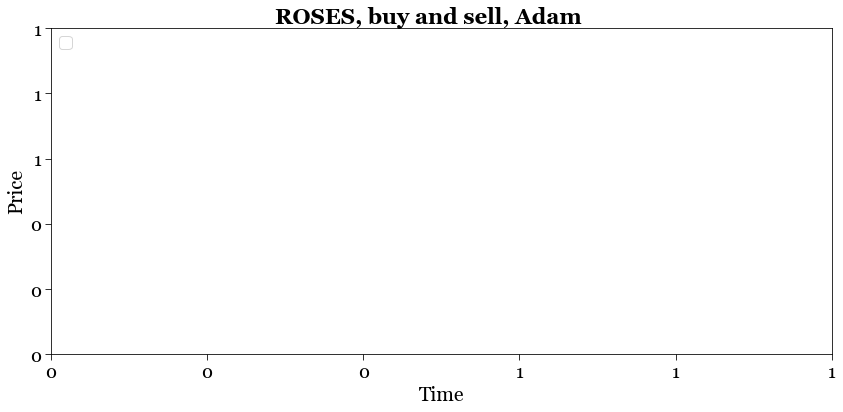

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


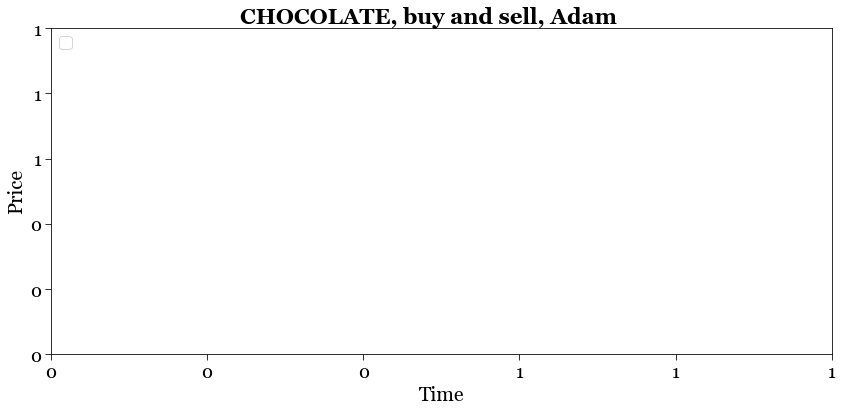

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


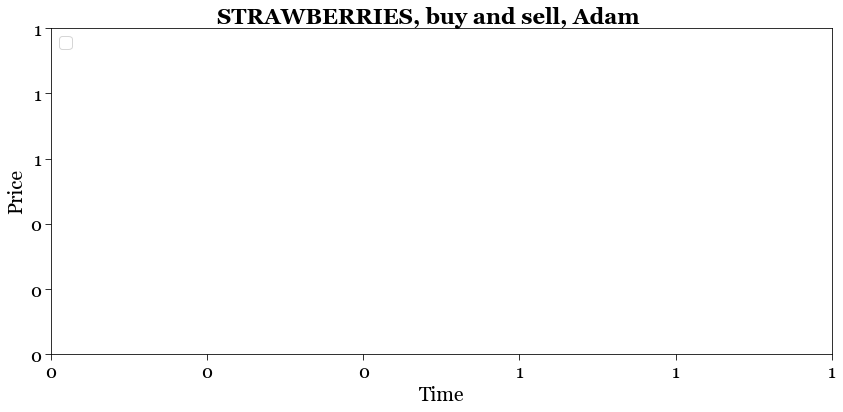

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


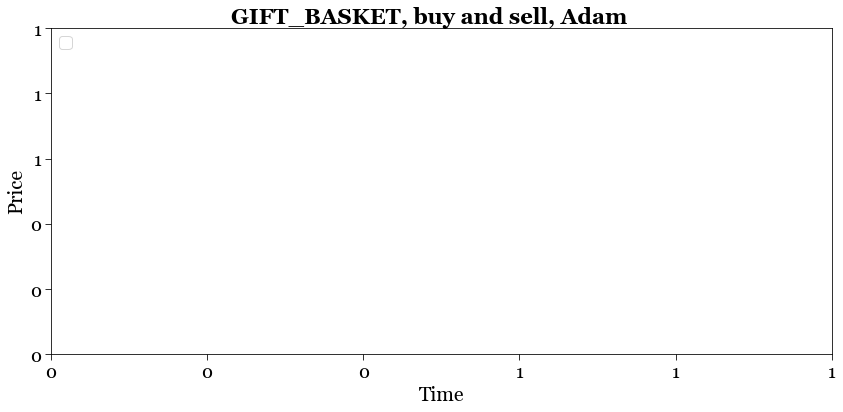

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


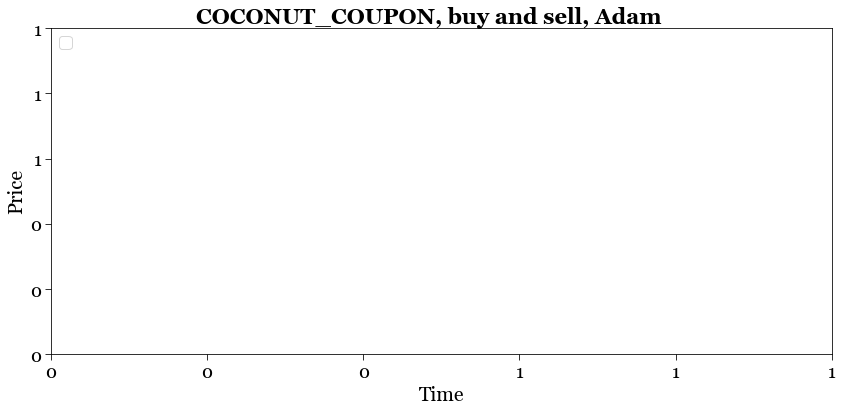

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


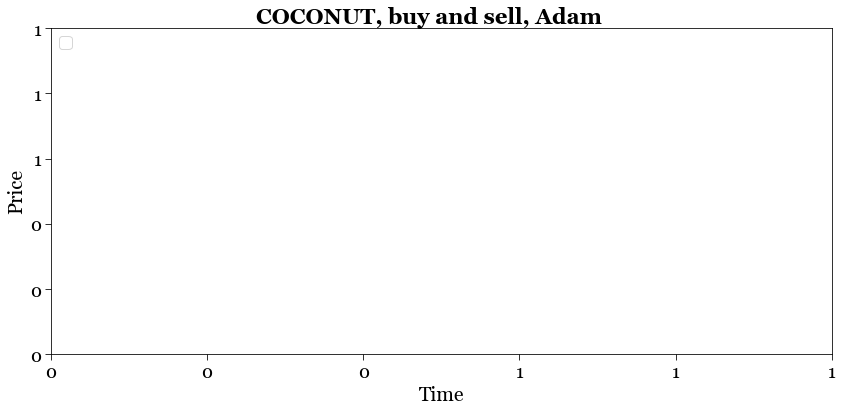

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


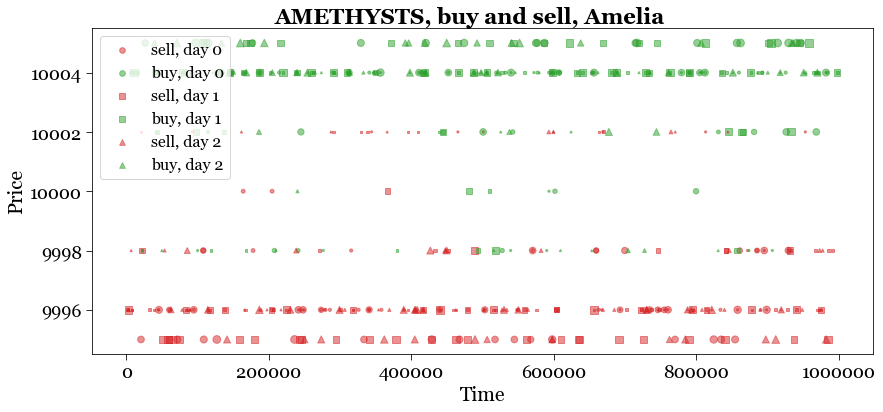

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


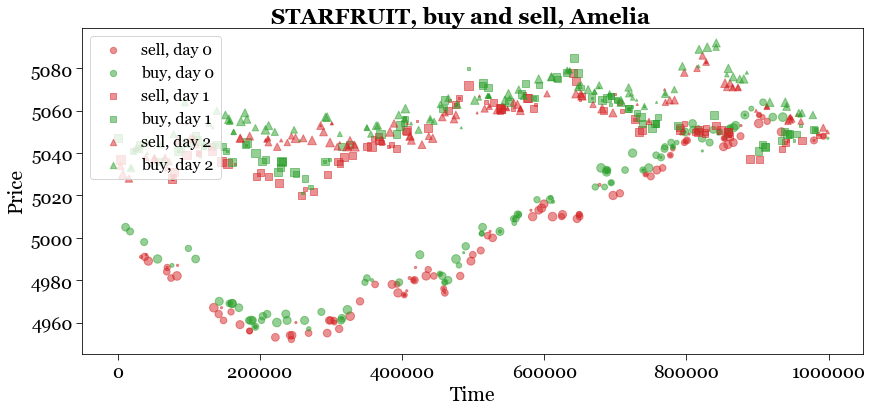

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


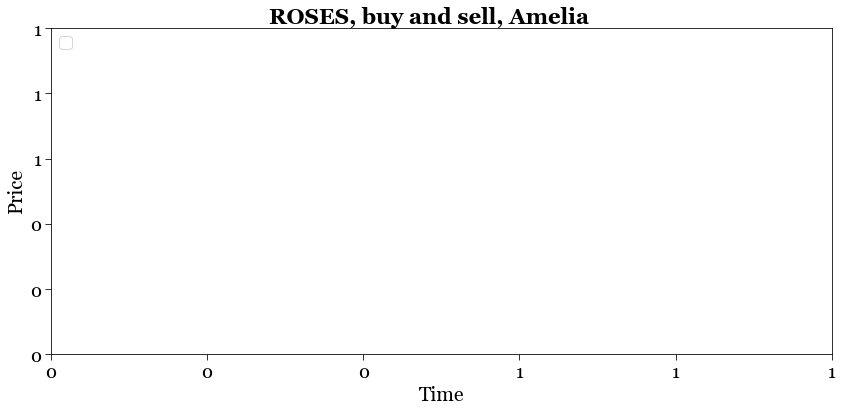

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


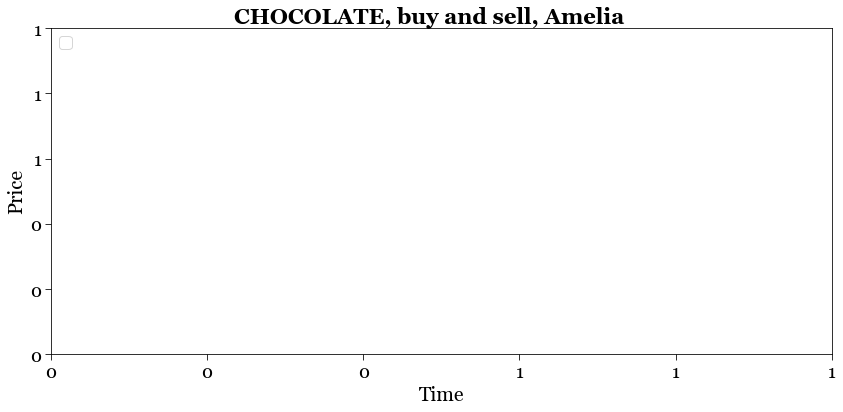

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


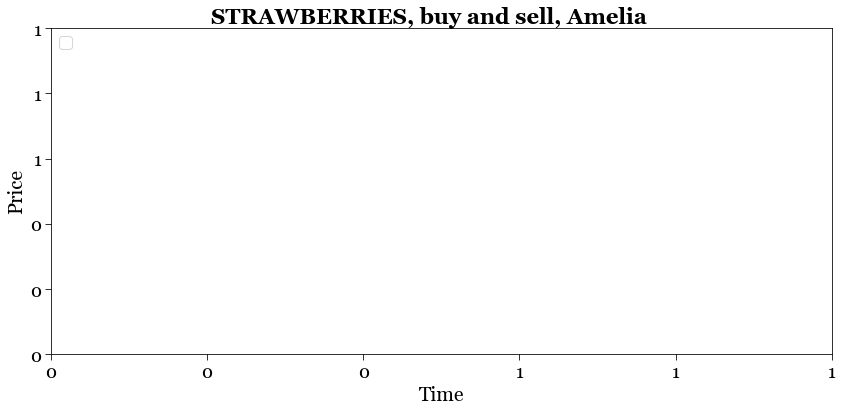

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


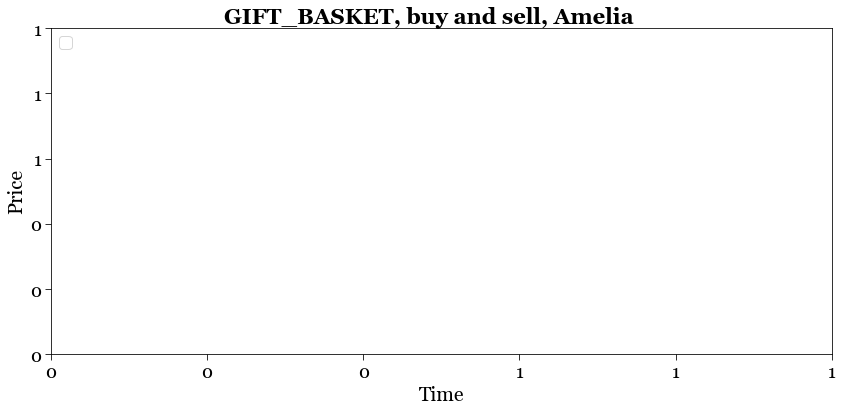

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


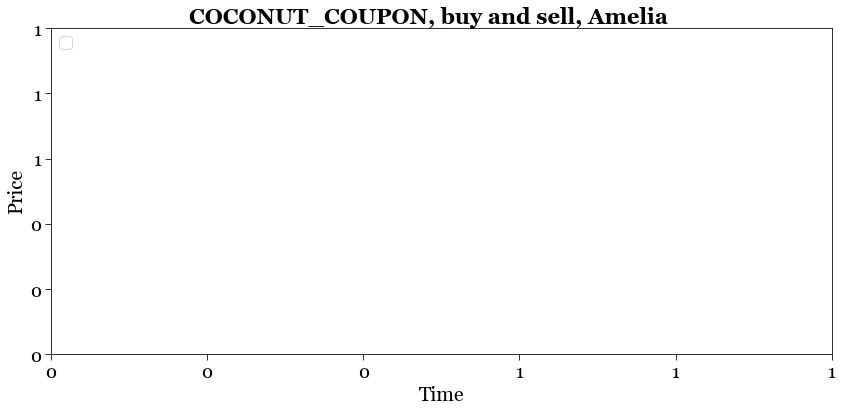

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


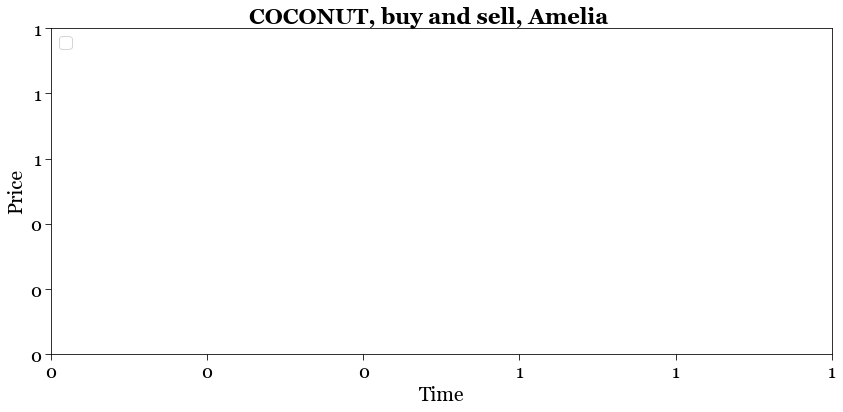

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


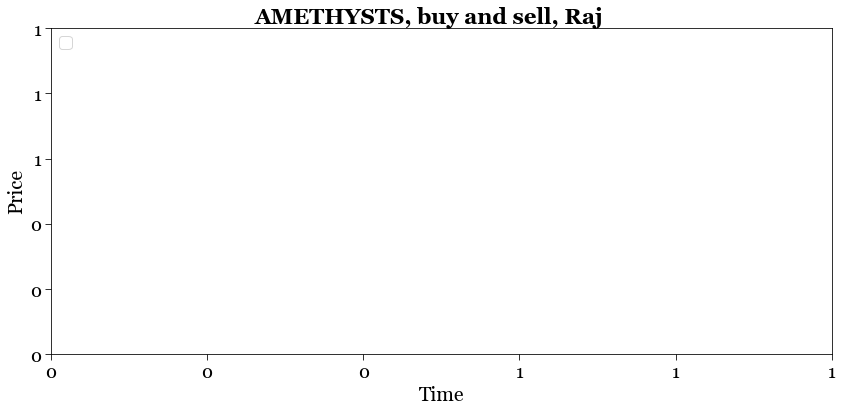

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


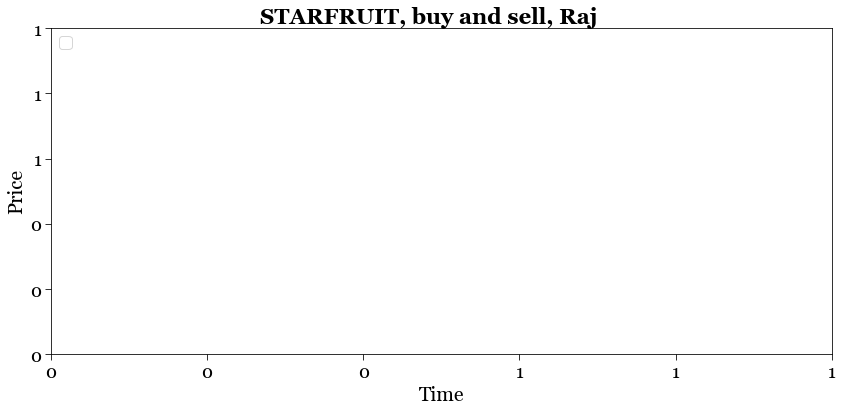

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


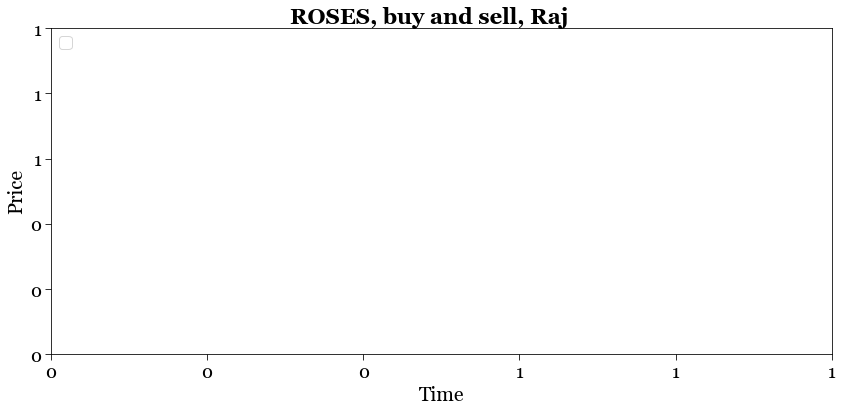

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


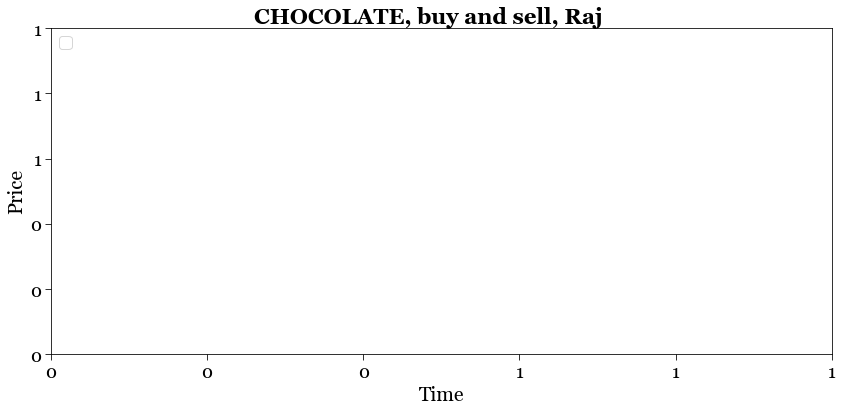

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


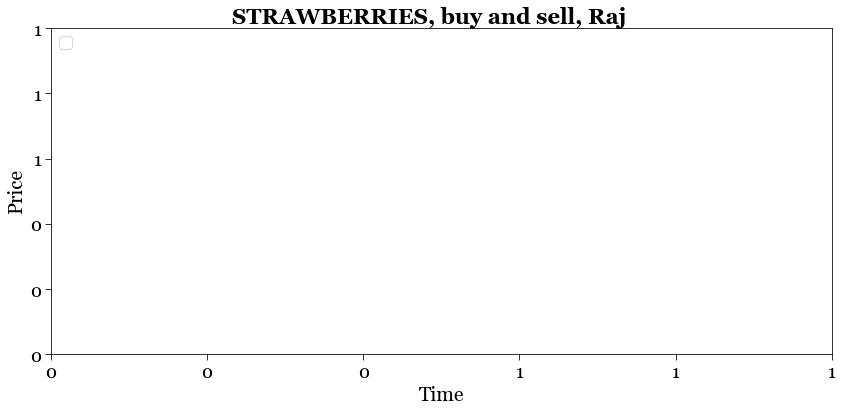

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


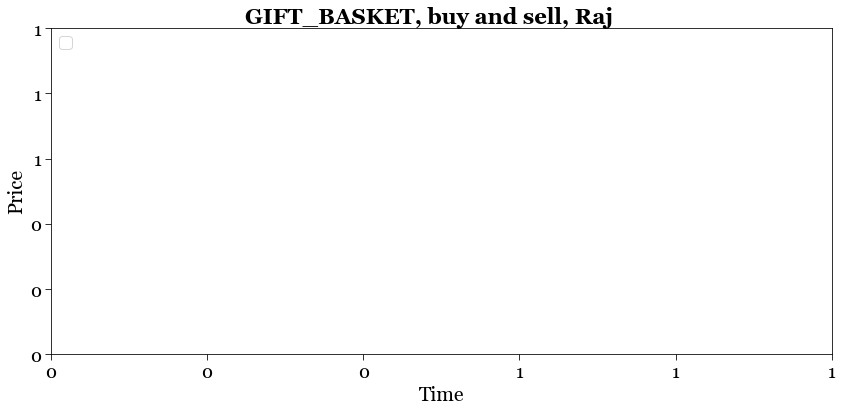

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


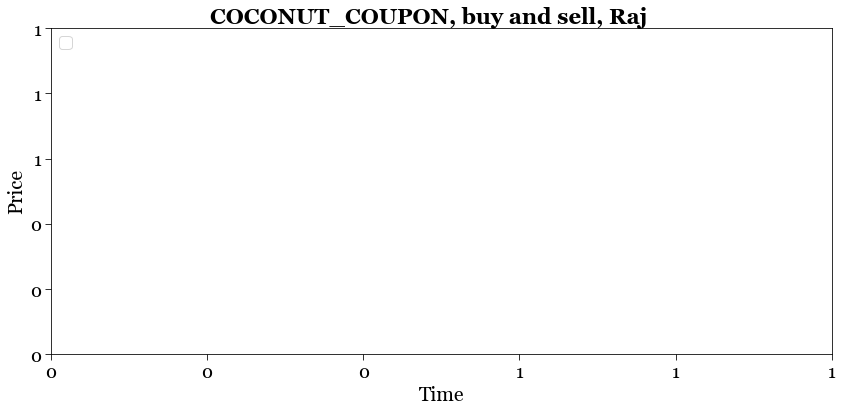

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_1856/1744266452.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


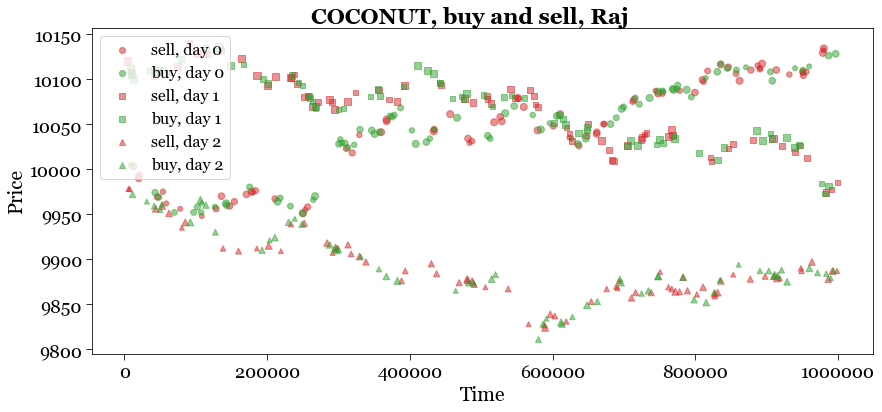

In [47]:
products = trade['symbol'].unique()
traders = trade['buyer'].unique() # keep color scheme the same
day_markers = ['o', 's', '^']

for it, trader in enumerate(traders):
    for product in products:
        fig = plt.figure(figsize=(14, 6))
        ax = plt.gca()

        for id, prod_day in enumerate(prod_days[product]): 
            # fig = plt.figure(figsize=(14, 6))
            # ax = plt.gca()

            sell_trade = trade[(trade['symbol'] == product) 
                                & (trade['seller'] == trader)
                                & (trade['day'] == prod_day)]
            buy_trade = trade[(trade['symbol'] == product) 
                                & (trade['buyer'] == trader)
                                & (trade['day'] == prod_day)]
            
            if sell_trade.empty and buy_trade.empty:
                continue

            ax.scatter(sell_trade['timestamp'], sell_trade['price'], label=f'sell, day {id}', alpha=0.5,
                        color=tableau_colors[3], marker=day_markers[id], s=5*sell_trade['quantity'])
            ax.scatter(buy_trade['timestamp'], buy_trade['price'], label=f'buy, day {id}', alpha=0.5,
                        color=tableau_colors[2], marker=day_markers[id], s=5*buy_trade['quantity'])
            
        # Customize tick sizes
        ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
        # ax.set_xlim(0, 2000)
        # ax.set_ylim(0, 12000)
        ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
        ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
        ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
        ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))

        # Customize the plot (optional)
        plt.xlabel('Time', fontdict=font)
        plt.ylabel('Price', fontdict=font)
        plt.gcf().set_facecolor('white')
        fig.suptitle(f'{product}, buy and sell, {trader}', fontproperties=suptitle_font, y=0.93)
        plt.legend(loc='upper left', prop=legend_font)

        # plt.savefig(f'./../plots/R5_{product}_{trader}.png')
        # plt.savefig(f'./../plots/R5_{product}_{trader}.pdf')
        plt.show()

### Outline for Volatility Analysis
For each day and each product - 
- Calculate volatility metrics such as standard deviation, variance, or average true range (ATR) for mid-price.
- To calculate instantaneous volatility for a time series of stock prices, you can use methods such as the exponentially weighted moving average (EWMA) of historical returns or the GARCH (Generalized Autoregressive Conditional Heteroskedasticity) model. The EWMA method is simpler and more commonly used for this purpose.
- Plot volatility over time to identify periods of high and low volatility.

0.017869191630991002


/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/1441661307.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/1441661307.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


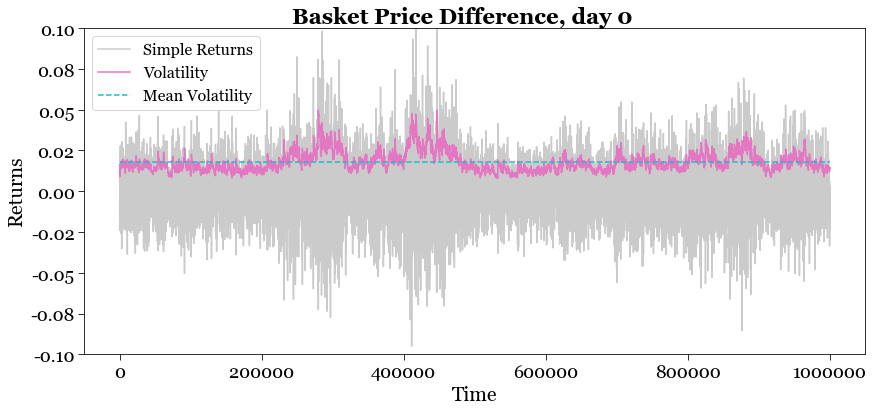

0.0165906967343853


/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/1441661307.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/1441661307.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


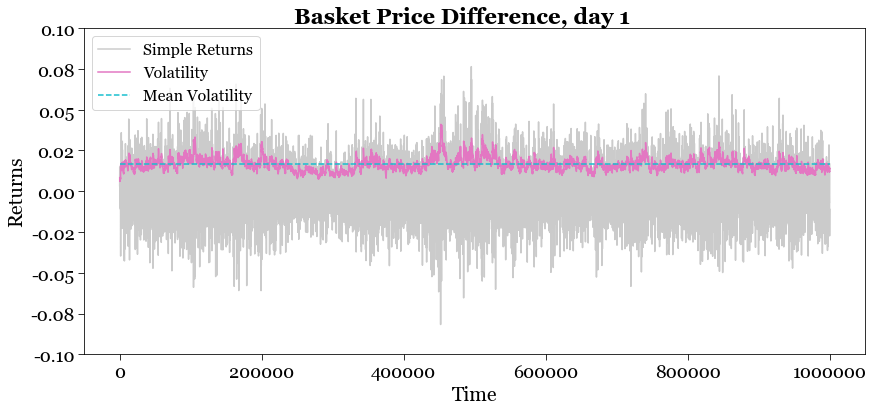

0.01681712071139382


/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/1441661307.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/1441661307.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


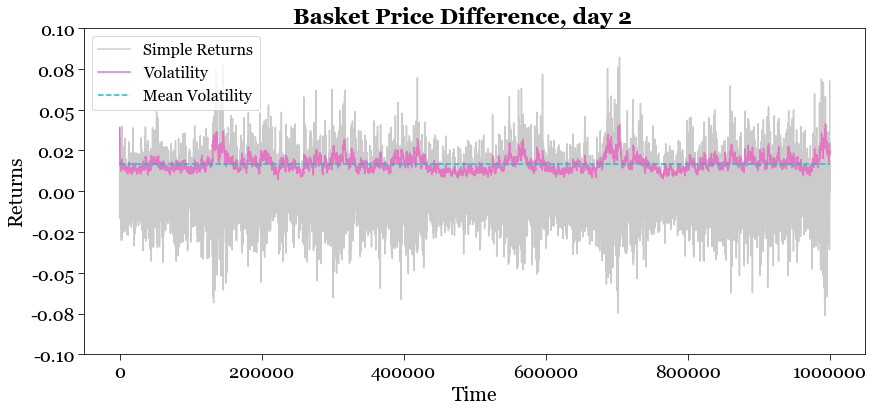

In [47]:
for day in days:
    filtered_price = df_pivot[(df_pivot['day'] == day)]

    fig = plt.figure(figsize=(14, 6))
    ax = plt.gca()
    
    xs = filtered_price['timestamp']
    y1s = filtered_price['BASKET']
    y2s = filtered_price['GIFT_BASKET']

    ydiff = y2s - y1s
    returns = ydiff.pct_change()

    # Calculate EWMA volatility
    window_size = 20  # You can adjust this value
    vols = returns.ewm(span=window_size).std()
    print(vols.mean())

    ax.plot(xs, returns, label='Simple Returns', 
            color=tableau_colors[7], alpha=0.4)
    ax.plot(xs, vols, label='Volatility', 
            color=tableau_colors[6], alpha=1)
    ax.hlines(vols.mean(), xs.min(), xs.max(), 
              color=tableau_colors[9], linestyle='--', 
              label='Mean Volatility')
    # Customize tick sizes
    ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
    # ax.set_xlim(0, 2000)
    ax.set_ylim(-0.1, 0.1)
    ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
    ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
    ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))

    # Customize the plot (optional)
    plt.xlabel('Time', fontdict=font)
    plt.ylabel('Returns', fontdict=font)
    plt.gcf().set_facecolor('white')
    fig.suptitle(f'Basket Price Difference, day {day}', fontproperties=suptitle_font, y=0.93)
    plt.legend(loc='upper left', prop=legend_font)

#     plt.savefig(f'./../plots/R3_pair_diff_day{day}_vol.png')
#     plt.savefig(f'./../plots/R3_pair_diff_day{day}_vol.pdf')
    plt.show()

### Outline for Autocorrelation Analysis:
For each product -
- Calculate autocorrelation functions (ACF) and partial autocorrelation functions (PACF) to identify any serial correlation in the time series data.
- Plot ACF and PACF to visualize autocorrelation patterns.

To interpret the plot, 
- Identification of Autoregressive (AR) and Moving Average (MA) Processes: The shape and pattern of the ACF plot can provide insights into the order of autoregressive (AR) and moving average (MA) processes present in the time series data. For example, slowly decaying ACF values suggest an AR process, while sharply decaying ACF values followed by a cutoff suggest an MA process.

If all autocorrelation values in the Autocorrelation Function (ACF) plot are close to 1 with very slight decay, it indicates a strong positive autocorrelation in the time series data. Here are some possible interpretations and considerations:
1. High Persistence: A high autocorrelation indicates that the values in the time series are strongly related to their past values. This suggests a high degree of persistence or memory in the data, where current observations are highly influenced by previous observations.
1. Trend or Seasonality: A persistent ACF plot may indicate the presence of a trend or seasonality in the data. Trends represent long-term patterns or changes in the data, while seasonality refers to repeating patterns that occur at regular intervals.
1. Potential Non-Stationarity: If the autocorrelation values remain close to 1 with very little decay even at high lags, it may indicate non-stationarity in the time series. Non-stationarity occurs when the statistical properties of the data, such as the mean or variance, change over time.
1. Modeling Considerations: When building time series models, it's important to account for the high autocorrelation and potential non-stationarity in the data. Models such as autoregressive integrated moving average (ARIMA) or seasonal ARIMA (SARIMA) may be suitable for capturing the persistence and seasonal patterns in the data.

In [184]:
ydiff.describe()

count    30000.000000
mean       379.490483
std         76.424382
min        140.000000
25%        329.000000
50%        381.000000
75%        430.000000
max        632.000000
dtype: float64

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/601140726.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/601140726.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


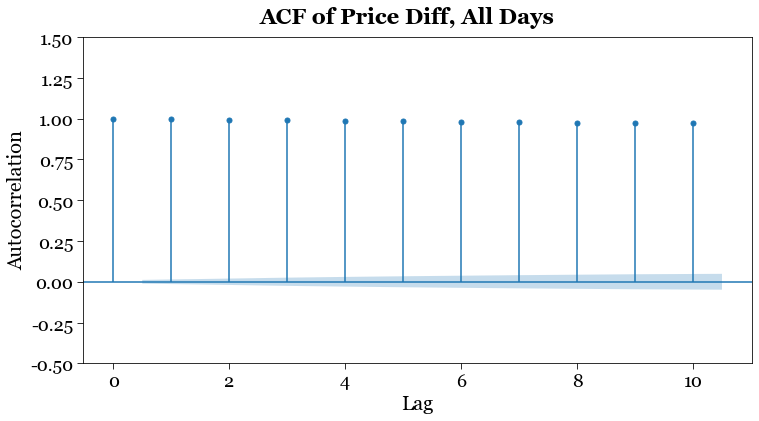

In [163]:
xs = df_pivot['timestamp']
y1s = df_pivot['BASKET']
y2s = df_pivot['GIFT_BASKET']
ydiff = y2s - y1s

# Plot Autocorrelation Function (ACF)
plt.figure(figsize=(12, 6))  # Adjust the width (12 inches) as needed, keep height (6 inches) constant
ax = plt.gca()

plot_acf(ydiff, lags=10, alpha=0.05, ax=ax)  # Adjust the number of lags and alpha as needed
# Customize tick sizes
ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
# ax.set_xlim(0, 2000)
ax.set_ylim(-0.5, 1.5)
ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))

# Customize the plot (optional)
plt.xlabel('Lag', fontdict=font)
plt.ylabel('Autocorrelation', fontdict=font)
plt.title('')
plt.gcf().set_facecolor('white')
plt.suptitle(f'ACF of Price Diff, All Days', 
                fontproperties=suptitle_font, y=0.95)
# plt.legend(loc='upper left', prop=legend_font)

# plt.savefig(f'./../plots/R3_ACF_diff.png')
# plt.savefig(f'./../plots/R3_ACF_diff.pdf')
plt.show()

### Outline for Stationarity Analysis
For each day and each product - 
- Test for stationarity using statistical tests like the Augmented Dickey-Fuller (ADF) test or the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test.
- If the time series is non-stationary, consider applying differencing techniques to make it stationary.

In [121]:
for product in products:
    print('#'*50)
    print(f"Augmented Dickey-Fuller Test for {product}")
    # Perform the Augmented Dickey-Fuller (ADF) test
    result = adfuller(df_pivot[product])

    # Extracting the test statistic, p-value, and critical values
    test_statistic = result[0]
    p_value = result[1]
    critical_values = result[4]

    # Print the results
    print("ADF Statistic:", test_statistic)
    print("p-value:", p_value)
    print("Critical Values:")
    for key, value in critical_values.items():
        print(f"\t{key}: {value}")

    # Interpret the results
    if p_value < 0.05:
        print("Reject the null hypothesis (H0): The data is stationary.")
    else:
        print("Fail to reject the null hypothesis (H0): The data is non-stationary.")

##################################################
Augmented Dickey-Fuller Test for CHOCOLATE
ADF Statistic: -0.2994322386643424
p-value: 0.9255847057230226
Critical Values:
	1%: -3.430568009855954
	5%: -2.8616363544632057
	10%: -2.566821286540422
Fail to reject the null hypothesis (H0): The data is non-stationary.
##################################################
Augmented Dickey-Fuller Test for ROSES
ADF Statistic: -2.999097777230968
p-value: 0.034978742477960484
Critical Values:
	1%: -3.4305680243931267
	5%: -2.861636360888007
	10%: -2.5668212899601888
Reject the null hypothesis (H0): The data is stationary.
##################################################
Augmented Dickey-Fuller Test for STRAWBERRIES
ADF Statistic: -0.9340552983663739
p-value: 0.776550791520825
Critical Values:
	1%: -3.4305680243931267
	5%: -2.861636360888007
	10%: -2.5668212899601888
Fail to reject the null hypothesis (H0): The data is non-stationary.
##################################################
Augmented

In [119]:
# Perform the Augmented Dickey-Fuller (ADF) test
result = adfuller(ydiff)

# Extracting the test statistic, p-value, and critical values
test_statistic = result[0]
p_value = result[1]
critical_values = result[4]

# Print the results
print("ADF Statistic:", test_statistic)
print("p-value:", p_value)
print("Critical Values:")
for key, value in critical_values.items():
    print(f"\t{key}: {value}")

# Interpret the results
if p_value < 0.05:
    print("Reject the null hypothesis (H0): The data is stationary.")
else:
    print("Fail to reject the null hypothesis (H0): The data is non-stationary.")

ADF Statistic: -6.446360786110667
p-value: 1.562322797552874e-08
Critical Values:
	1%: -3.430568009855954
	5%: -2.8616363544632057
	10%: -2.566821286540422
Reject the null hypothesis (H0): The data is stationary.


#### Make the data stationary 
For stationary data:
- ACF can provide insights into the dependence structure of the time series, including the presence of serial correlation at different lags.
- Significant autocorrelation at certain lags may indicate potential patterns or dependencies in the data that can be exploited for modeling and forecasting.

It's common practice to first make the data stationary through techniques like differencing or detrending before analyzing the ACF. Stationarity helps remove spurious autocorrelation and makes the ACF results more interpretable for time series analysis and modeling. 

In [135]:
df_pivot['DIFF'] = df_pivot['GIFT_BASKET'] - df_pivot['BASKET']
df_pivot
cols = df_pivot.columns[2:]

In [180]:
products

array(['CHOCOLATE', 'ROSES', 'STRAWBERRIES', 'GIFT_BASKET'], dtype=object)

In [138]:
# Make the data stationary
for col in cols:
    df_pivot[f'{col}_diff'] = df_pivot[col].diff()
    df_pivot[f'{col}_diff'] = df_pivot[f'{col}_diff'].fillna(0)
df_pivot

product,day,timestamp,CHOCOLATE,GIFT_BASKET,ROSES,STRAWBERRIES,BASKET,DIFF,CHOCOLATE_diff,GIFT_BASKET_diff,ROSES_diff,STRAWBERRIES_diff,BASKET_diff,DIFF_diff
0,0,0,8000.0,71355.0,15000.0,4000.0,71000.0,355.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,100,8001.5,71349.5,15000.0,3999.5,71003.0,346.5,1.5,-5.5,0.0,-0.5,3.0,-8.5
2,0,200,8001.0,71347.0,15000.5,3999.5,71001.5,345.5,-0.5,-2.5,0.5,0.0,-1.5,-1.0
3,0,300,8002.5,71350.5,15000.0,3999.5,71007.0,343.5,1.5,3.5,-0.5,0.0,5.5,-2.0
4,0,400,8002.0,71341.5,14997.5,3999.5,71002.5,339.0,-0.5,-9.0,-2.5,0.0,-4.5,-4.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,2,999500,7750.5,69534.5,14409.5,3983.5,69312.5,222.0,-2.0,-14.0,4.0,-0.5,-7.0,-7.0
29996,2,999600,7750.5,69529.5,14408.0,3983.5,69311.0,218.5,0.0,-5.0,-1.5,0.0,-1.5,-3.5
29997,2,999700,7750.5,69543.0,14411.5,3984.5,69320.5,222.5,0.0,13.5,3.5,1.0,9.5,4.0
29998,2,999800,7750.0,69542.0,14412.5,3984.5,69319.5,222.5,-0.5,-1.0,1.0,0.0,-1.0,0.0


/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


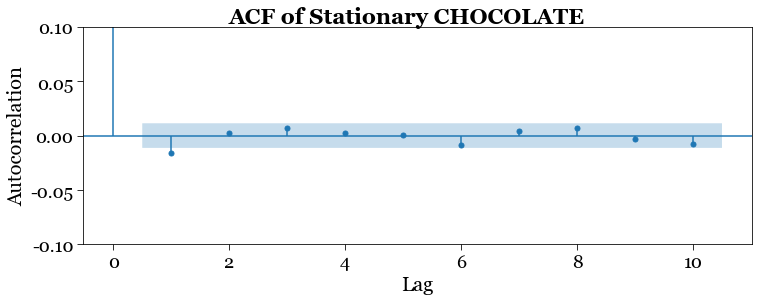

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


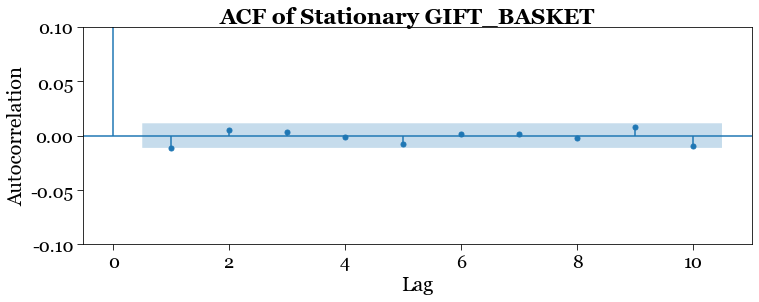

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


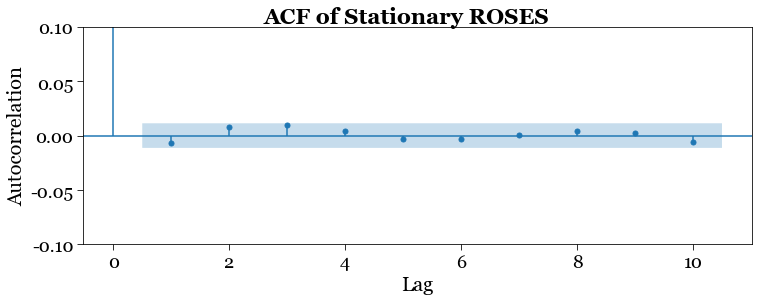

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


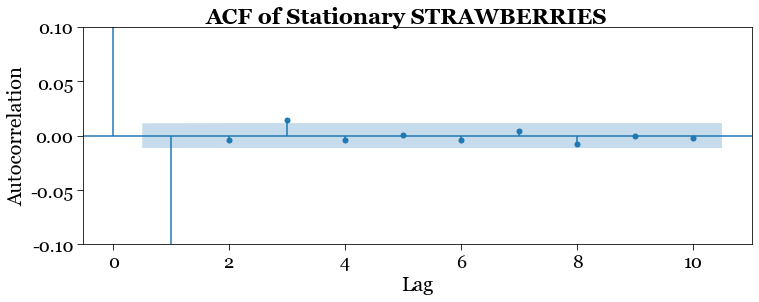

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


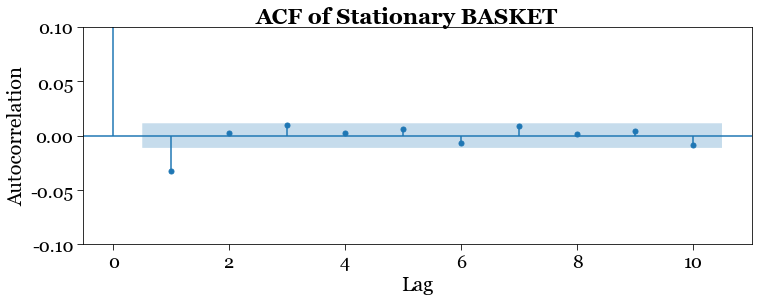

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3281082685.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


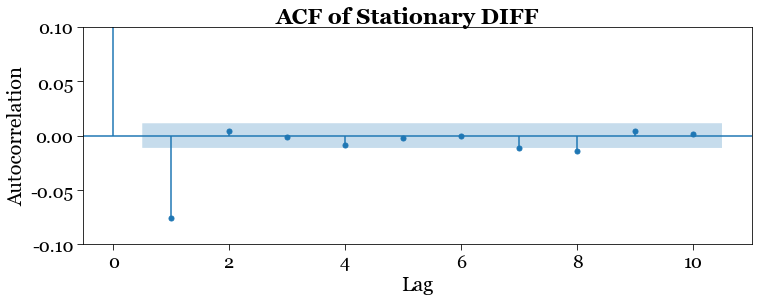

In [167]:
# Plot Autocorrelation Function (ACF)
for col in df_pivot.columns:
    if col[-5::] == '_diff':
        plt.figure(figsize=(12, 4))  # Adjust the width (12 inches) as needed, keep height (6 inches) constant
        ax = plt.gca()

        plot_acf(df_pivot[col], lags=10, alpha=0.05, ax=ax)  # Adjust the number of lags and alpha as needed
        # Customize tick sizes
        ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
        # ax.set_xlim(0, 2000)
        ax.set_ylim(-0.1, 0.1)
        ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
        ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
        ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
        ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))

        # Customize the plot (optional)
        plt.xlabel('Lag', fontdict=font)
        plt.ylabel('Autocorrelation', fontdict=font)
        plt.title('')
        plt.gcf().set_facecolor('white')
        plt.suptitle(f'ACF of Stationary {col[:-5:]}', 
                        fontproperties=suptitle_font, y=0.95)
        # plt.legend(loc='upper left', prop=legend_font)

        # plt.savefig(f'./../plots/R3_ACF_stationary_50_{col[:-5:]}.png')
        # plt.savefig(f'./../plots/R3_ACF_stationary_50_{col[:-5:]}.pdf')

        # zoom in
        # plt.savefig(f'./../plots/R3_ACF_stationary_10_{col[:-5:]}.png')
        # plt.savefig(f'./../plots/R3_ACF_stationary_10_{col[:-5:]}.pdf')

        plt.show()

### Outline for Seasonality Analysis:
- Detect and analyze seasonal patterns in the time series data using methods like seasonal decomposition or Fourier analysis. 

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


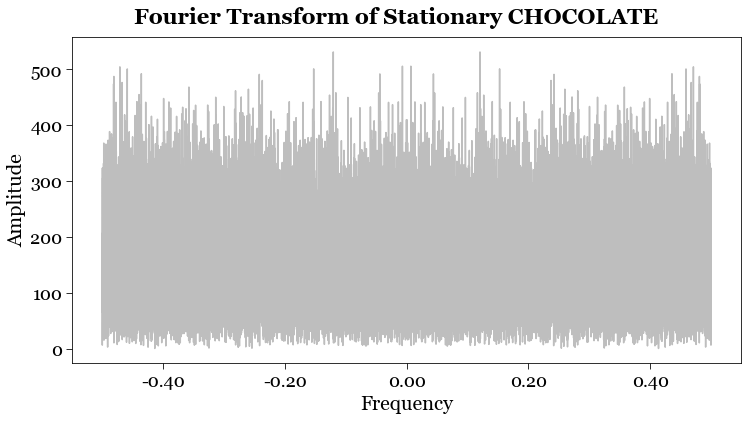

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


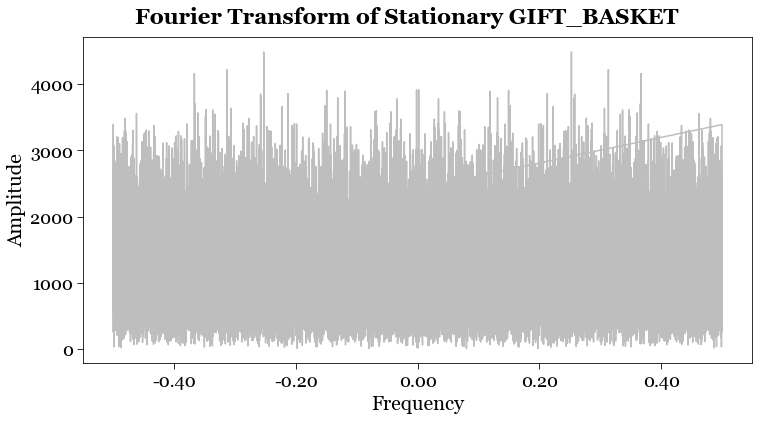

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


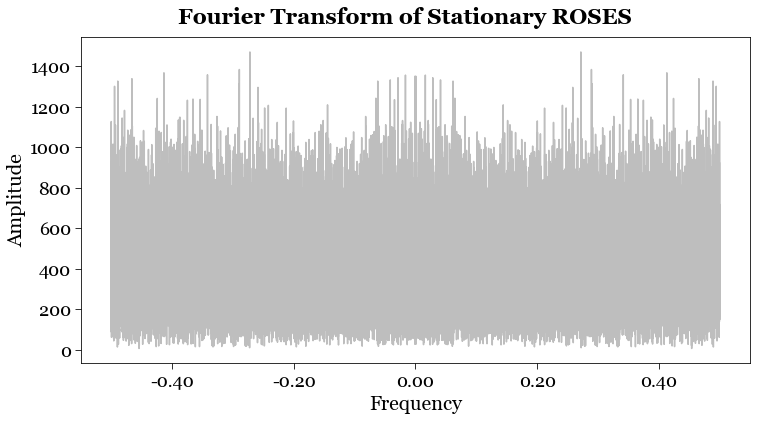

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


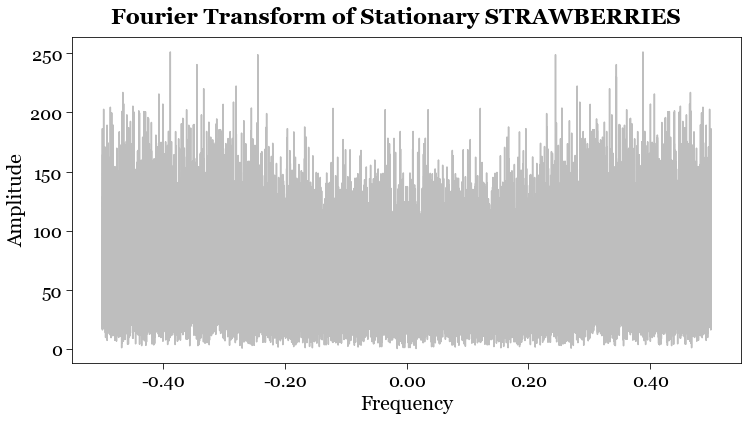

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


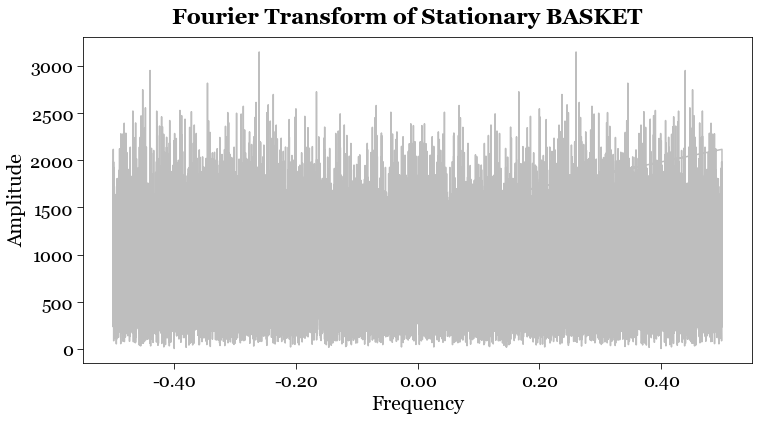

/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
/var/folders/h6/9mpjzmxd77l7493g4210phz00000gn/T/ipykernel_3414/3520484368.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)


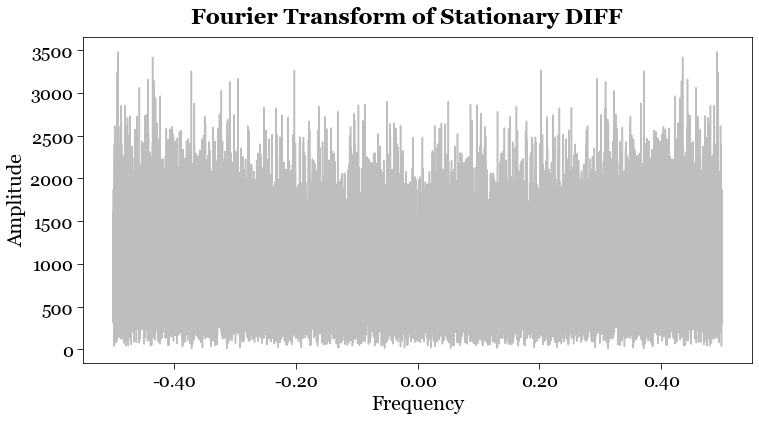

In [177]:
for col in df_pivot.columns:
    if col[-5::] == '_diff':
        plt.figure(figsize=(12, 6))
        ax = plt.gca()

        # Perform Fourier transform
        fourier_transform = np.fft.fft(df_pivot[col])
        
        # Compute the frequencies
        frequencies = np.fft.fftfreq(len(df_pivot[col]))

        ax.plot(frequencies, np.abs(fourier_transform),
                color=tableau_colors[7], alpha=0.5)

        # Customize tick sizes
        ax.tick_params(axis='both', which='major', labelsize=18, length=6)  # Adjust label size and tick length
        # ax.set_xlim(0, 2000)
        # ax.set_ylim(-1.2, 1.2)
        ax.set_xticklabels(ax.get_xticks(), fontdict=tick_font)
        ax.set_yticklabels(ax.get_yticks(), fontdict=tick_font)
        ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))
        ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))

        # Customize the plot (optional)
        plt.xlabel('Frequency', fontdict=font)
        plt.ylabel('Amplitude', fontdict=font)
        plt.title('')
        plt.gcf().set_facecolor('white')
        plt.suptitle(f'Fourier Transform of Stationary {col[:-5:]}', 
                        fontproperties=suptitle_font, y=0.95)
        # plt.legend(loc='upper left', prop=legend_font)

        # plt.savefig(f'./../plots/R3_FFT_{col[:-5:]}.png')
        # plt.savefig(f'./../plots/R3_FFT_{col[:-5:]}.pdf')
        plt.show()


### Outline for Data Modeling
For each day and each product - 
- Fit time series models such as ARIMA (AutoRegressive Integrated Moving Average) or GARCH (Generalized Autoregressive Conditional Heteroskedasticity) models to forecast future prices or quantities.
- Evaluate model performance using techniques like backtesting or out-of-sample validation.

To perform ARIMA modeling in Python, you can use the statsmodels library, which provides tools for time series analysis and modeling. Here's a step-by-step guide on how to do ARIMA modeling in Python:
1. Split Data into Training and Testing Sets: Split your data into training and testing sets. Typically, you would use the earlier portion of the data for training and the later portion for testing.
1. Fit ARIMA Model: Fit an ARIMA model to the training data. Specify the order of the ARIMA model (p, d, q) based on the characteristics of your data and any insights from prior analysis.
1. Make Forecasts: Use the fitted ARIMA model to make forecasts for future time periods.
1. Evaluate Model Performance: Evaluate the performance of the ARIMA model using appropriate metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), or others.
1. Visualize Results: Visualize the original time series data, the fitted values, and the forecasts to assess the accuracy of the ARIMA model.
